In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from macrohet import visualise
from tqdm.auto import tqdm
import os
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Conversion factor
meters_per_pixel = 1.4949402023919043E-07  # Micrometers per pixel
micrometers_per_pixel = meters_per_pixel*1E6 # Micrometers per pixel

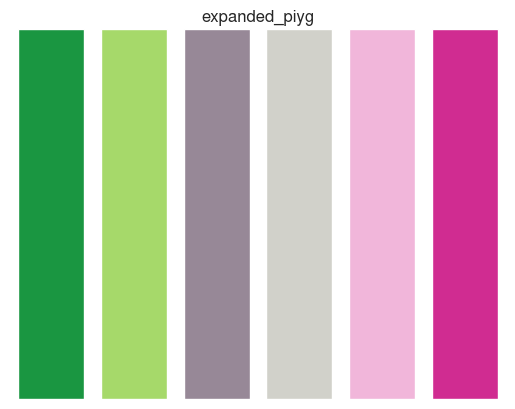

['#1a9641', '#a6d96a', '#978897', '#d1d1ca', '#f1b6da', '#d02c91']


In [3]:
# set display params
sns.set(style = 'white')
# Set the default font to Helvetica
mpl.rcParams['font.family'] = 'Nimbus Sans'
# import matplotlib as mpl
# mpl.rcdefaults()
# Get the color palette of the PiYG color map
expanded_piyg = visualise.color_palette('expanded_piyg').colors
sns.set_palette(expanded_piyg)
# Display the colors in the PiYG color map
visualise.show_colors('expanded_piyg')
print(expanded_piyg)

In [4]:
output_dir = '/mnt/SYNO/macrohet_syno/manuscript/results/hpig_24'#/mnt/DATA/macrohet/results/preliminary_sc_measures/cumulative_sc_plots/thresholded_480/'#'/Users/dayn/data/macrohet_mac/temp_results/'#
os.makedirs(output_dir, exist_ok = True)

In [5]:
df = pd.read_pickle('/mnt/SYNO/macrohet_syno/manuscript/results/dt_df.pkl')
# Assuming your DataFrame is named 'df'
df['Strain/Compound'] = df['Compound']  # Create a new column and copy values from 'Compound'
# Replace values in 'NewColumn' where 'Strain' is 'RD1' with 'RD1'
df.loc[df['Strain'] == 'RD1', 'Strain/Compound'] = 'RD1'
df

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/SYNO/macrohet_syno/manuscript/results/dt_df.pkl'

In [111]:
len(df[df['Experiment ID'] == 'ND0003']['Unique ID'].unique())

6721

### Quantifying cell counts

In [7]:
subset_df = df[(df['r2']>0.7)]

In [112]:
for r2 in [0.0, 0.4, 0.6, 0.8, 0.9]:
    print(r2)
    for expt_ID in df['Experiment ID'].unique():
        if expt_ID == 'PS0000':
            subset_df = df
        else: 
            subset_df = df[(df['r2']>=r2)]
        expt_df = subset_df[subset_df['Experiment ID'] == expt_ID]
        print(expt_ID, len(expt_df['Unique ID'].unique()))

0.0
PS0000 3914
ND0002 1163
ND0003 4147
0.4
PS0000 3914
ND0002 1029
ND0003 3603
0.6
PS0000 3914
ND0002 899
ND0003 2976
0.8
PS0000 3914
ND0002 692
ND0003 1899
0.9
PS0000 3914
ND0002 475
ND0003 1103


In [8]:
subset_df = df[(df['r2']>0.7) & (df['dt']>0) & (df['Strain/Compound'] != 'RD1')]

In [9]:
hue_order = ['EC50', 'EC0', 'EC99']

### Boxenplot

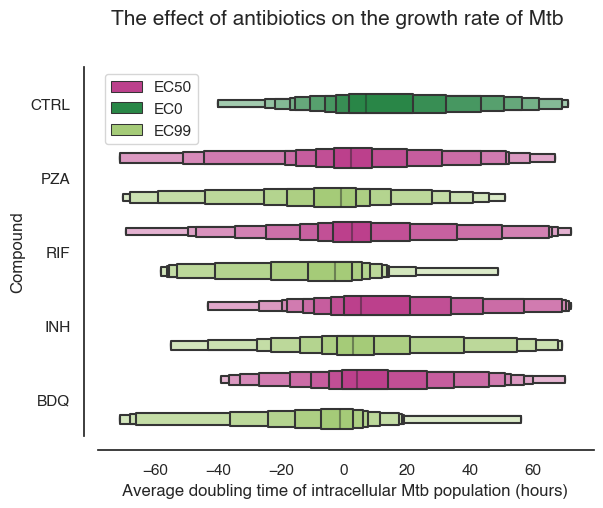

In [55]:
subset_df = df[(df['r2']>0.5) & (df['Strain/Compound'] != 'RD1')]

g = sns.boxenplot(x="dt", y="Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=subset_df,
            hue_order=hue_order,
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'upper left')
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt.png'), bbox_inches = 'tight', dpi = 314)

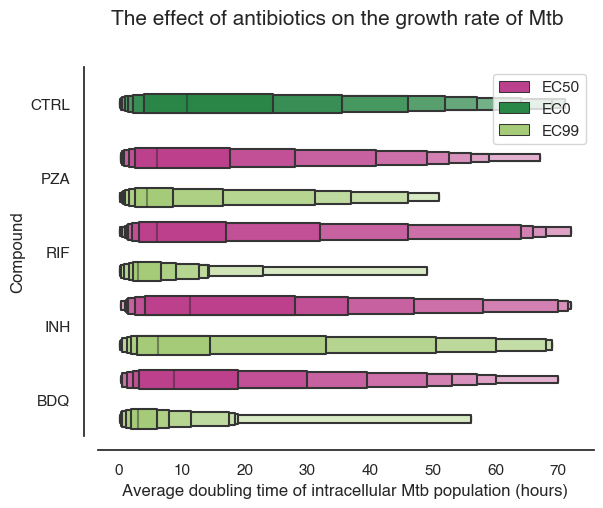

In [62]:
subset_df = df[(df['r2']>0.5) & (df['dt']>0) & (df['Strain/Compound'] != 'RD1')]

g = sns.boxenplot(x="dt", y="Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=subset_df, 
            hue_order=hue_order,
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'upper right')
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0.png'), bbox_inches = 'tight', dpi = 314)

# Final graphs

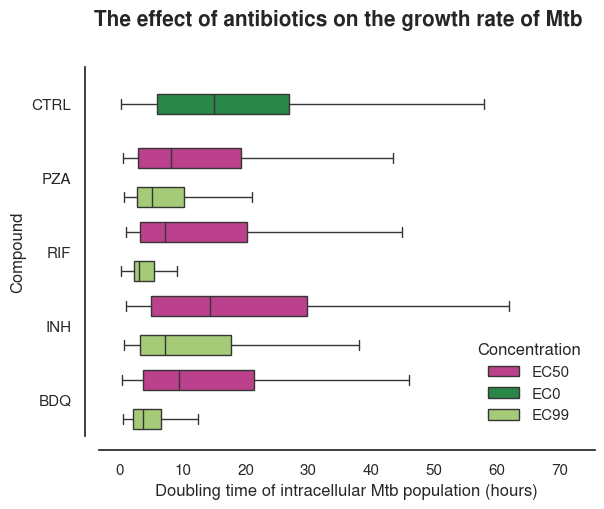

In [343]:
subset_df = df[(df['r2']>0.7) & (df['r2']<1) & (df['dt']>0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

g = sns.boxplot(x="dt", y="Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=subset_df, 
            hue_order=hue_order, fliersize = 0
            # scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right', frameon = False, title = 'Concentration')
# plt.xlim(0, 40)
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0_violin.png'), bbox_inches='tight', dpi=314)


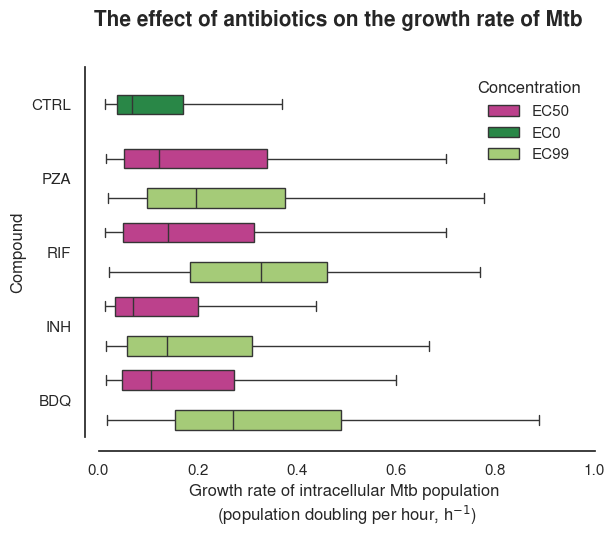

In [342]:
subset_df = df[(df['r2']>0.7) & (df['r2']<1) & (df['dt']>0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])
# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0
                # scale = 'linear'
               )  
sns.despine(offset = 10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'upper right', frameon = False, title = 'Concentration')
plt.xlim(0, 1)
plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_violin.png'), bbox_inches='tight', dpi=314)


## with stats

Compound: PZA, Concentration: EC50, U-statistic: 42965, p-value: 6.190e-06
Compound: PZA, Concentration: EC99, U-statistic: 20664, p-value: 4.834e-12
Compound: RIF, Concentration: EC50, U-statistic: 38647, p-value: 2.887e-05
Compound: RIF, Concentration: EC99, U-statistic: 7903, p-value: 1.073e-19
Compound: INH, Concentration: EC50, U-statistic: 76635, p-value: 8.891e-01
Compound: INH, Concentration: EC99, U-statistic: 40715, p-value: 2.296e-05
Compound: BDQ, Concentration: EC50, U-statistic: 56633, p-value: 2.635e-04
Compound: BDQ, Concentration: EC99, U-statistic: 7717, p-value: 3.216e-15


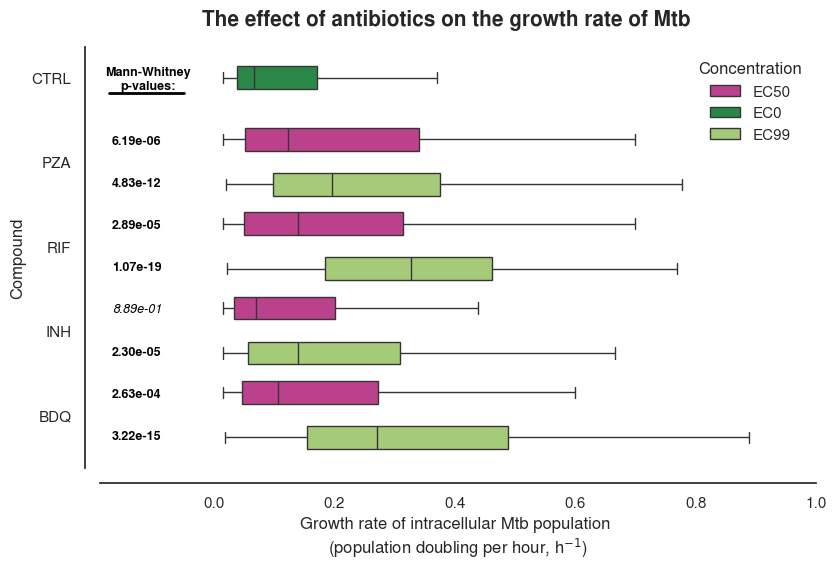

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

plt.figure(figsize=(13.8583/1.5, 8.18898/1.5))  # Matplotlib expects dimensions in inches

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.19
plt.xlim(xlim_min, 1)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(x+0.02, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'{p_text}', xy=(x+0.02, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min+0.08, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+0.015, xlim_min+0.14], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title


plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_boxplot_stats_stretch.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()


In [651]:
subset_df[subset_df['Compound'] == 'CTRL'].keys()

Index(['Time (hours)', 'Mtb Area (µm)', 'dMtb Area (µm)', 'Mphi Area (µm)',
       'dMphi Area (µm)', 'Infection Status', 'Initial Infection Status',
       'Final Infection Status', 'x', 'y', 'GFP', 'RFP', 'Eccentricity', 'MSD',
       'Technical Replicate', 'Biological Replicate', 'Strain', 'Compound',
       'Concentration', 'Cell ID', 'Acquisition ID', 'Experiment ID',
       'Unique ID', 'ID', 'dt', 'dts', 'r2', 'T_d', 'dt_dmtb', 'dmtb', 'dts_0',
       'dts_1', 'dts_2', 'dts_3', 'dts_4', 'dmtb_0', 'dmtb_1', 'dmtb_2',
       'dmtb_3', 'dmtb_4', 'dt_0', 'dt_1', 'dt_2', 'dt_3', 'dt_4', 'dt_5',
       'dt_6', 'dmtb_5', 'dmtb_6', 'dt_7', 'dmtb_7', 'dt_8', 'dmtb_8', 'dt_9',
       'dmtb_9', 'dt_10', 'dt_11', 'dmtb_10', 'dmtb_11', 'Strain/Compound',
       'reciprocal_dt', 'Doubling time (hours)', 'Growth rate (1/h)',
       'Displacement (µm)'],
      dtype='object')

In [653]:
subset_df[subset_df['Compound'] == 'CTRL']['Experiment ID'].unique()

array(['PS0000', 'ND0002', 'ND0003'], dtype=object)

In [659]:
print(subset_df[subset_df['Compound'] == 'CTRL'][['Experiment ID', 'Acquisition ID']].drop_duplicates().values)
print(len(subset_df[subset_df['Compound'] == 'CTRL'][['Experiment ID', 'Acquisition ID']].drop_duplicates().values))

[['PS0000' (3, 5)]
 ['PS0000' (4, 5)]
 ['PS0000' (5, 5)]
 ['PS0000' (6, 5)]
 ['ND0002' (3, 3)]
 ['ND0002' (3, 4)]
 ['ND0002' (4, 3)]
 ['ND0002' (4, 4)]
 ['ND0003' (3, 3)]
 ['ND0003' (3, 4)]
 ['ND0003' (4, 3)]
 ['ND0003' (4, 4)]]
12


In [660]:
print(subset_df[(subset_df['Compound'] == 'PZA') & (subset_df['Concentration'] == 'EC99')][['Experiment ID', 'Acquisition ID']].drop_duplicates().values)
print(len(subset_df[(subset_df['Compound'] == 'PZA') & (subset_df['Concentration'] == 'EC99')][['Experiment ID', 'Acquisition ID']].drop_duplicates().values))

[['PS0000' (5, 6)]
 ['PS0000' (6, 6)]
 ['ND0002' (4, 5)]
 ['ND0002' (4, 6)]
 ['ND0003' (4, 5)]
 ['ND0003' (4, 6)]]
6


Compound: PZA, Concentration: EC50, U-statistic: 42965, p-value: 6.190e-06
Compound: PZA, Concentration: EC99, U-statistic: 20664, p-value: 4.834e-12
Compound: RIF, Concentration: EC50, U-statistic: 38647, p-value: 2.887e-05
Compound: RIF, Concentration: EC99, U-statistic: 7903, p-value: 1.073e-19
Compound: INH, Concentration: EC50, U-statistic: 76635, p-value: 8.891e-01
Compound: INH, Concentration: EC99, U-statistic: 40715, p-value: 2.296e-05
Compound: BDQ, Concentration: EC50, U-statistic: 56633, p-value: 2.635e-04
Compound: BDQ, Concentration: EC99, U-statistic: 7717, p-value: 3.216e-15


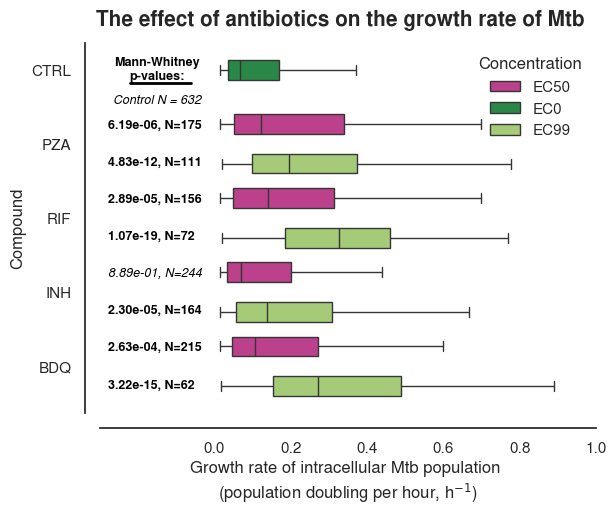

In [664]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")


# Calculate sample sizes
sample_sizes = subset_df.groupby(['Compound', 'Concentration']).size().reset_index(name='N')

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
xlim_max = 1
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')

# # Annotate sample sizes next to each category
# compound_order = subset_df['Compound'].unique()
# for idx, compound in enumerate(compound_order):
#     n_count = sample_sizes[sample_sizes['Compound'] == compound]['N'].sum()
#     plt.annotate(f'N={n_count}', xy=(xlim_max - (xlim_max*0.1), idx), xycoords='data',
#                  horizontalalignment='left', verticalalignment='center',
#                  fontsize=9, color='black')
    
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+0.08, xlim_min+0.24], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.annotate(f'Control N = {len(control_data)}', xy=(xlim_min/2, 0.45),
                         fontsize=9, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, xlim_max+0.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_boxplot_stats_N_stretch.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()


Compound: PZA, Concentration: EC50, U-statistic: 42965, p-value: 6.190e-06
Compound: PZA, Concentration: EC99, U-statistic: 20664, p-value: 4.834e-12
Compound: RIF, Concentration: EC50, U-statistic: 38647, p-value: 2.887e-05
Compound: RIF, Concentration: EC99, U-statistic: 7903, p-value: 1.073e-19
Compound: INH, Concentration: EC50, U-statistic: 76635, p-value: 8.891e-01
Compound: INH, Concentration: EC99, U-statistic: 40715, p-value: 2.296e-05
Compound: BDQ, Concentration: EC50, U-statistic: 56633, p-value: 2.635e-04
Compound: BDQ, Concentration: EC99, U-statistic: 7717, p-value: 3.216e-15


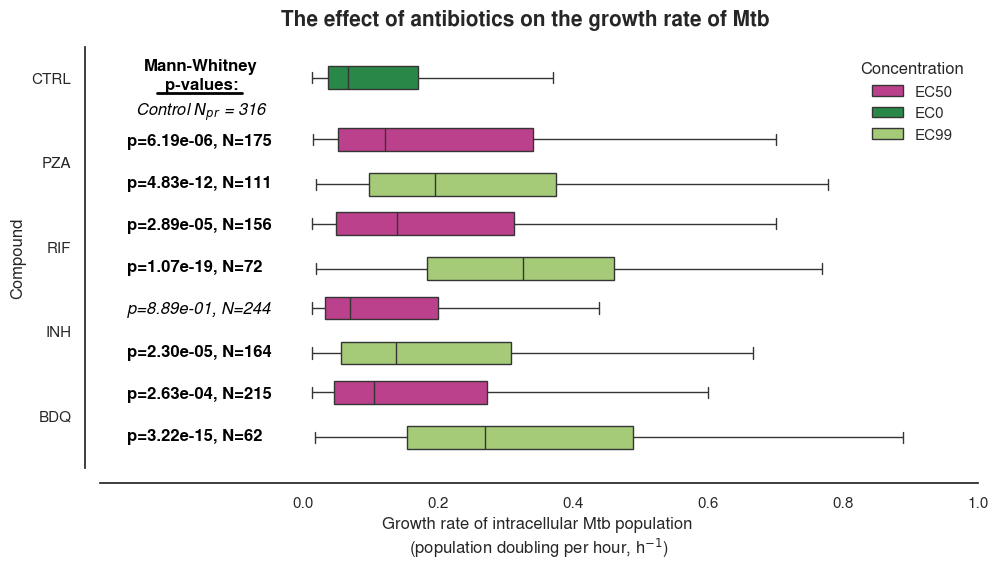

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")


# Calculate sample sizes
sample_sizes = subset_df.groupby(['Compound', 'Concentration']).size().reset_index(name='N')
plt.figure(figsize=(16/1.5, 8.18898/1.5))

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
xlim_max = 1
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=12, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.04, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=12, color='black', style = 'italic')

# # Annotate sample sizes next to each category
# compound_order = subset_df['Compound'].unique()
# for idx, compound in enumerate(compound_order):
#     n_count = sample_sizes[sample_sizes['Compound'] == compound]['N'].sum()
#     plt.annotate(f'N={n_count}', xy=(xlim_max - (xlim_max*0.1), idx), xycoords='data',
#                  horizontalalignment='left', verticalalignment='center',
#                  fontsize=9, color='black')
    
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=12, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+0.085, xlim_min+0.21], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=12, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, xlim_max+0.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_boxplot_stats_scaledN_strech.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()


Compound: PZA, Concentration: EC50, U-statistic: 67634, p-value: 6.190e-06
Compound: PZA, Concentration: EC99, U-statistic: 49488, p-value: 4.834e-12
Compound: RIF, Concentration: EC50, U-statistic: 59944, p-value: 2.887e-05
Compound: RIF, Concentration: EC99, U-statistic: 37600, p-value: 1.073e-19
Compound: INH, Concentration: EC50, U-statistic: 77572, p-value: 8.891e-01
Compound: INH, Concentration: EC99, U-statistic: 62933, p-value: 2.296e-05
Compound: BDQ, Concentration: EC50, U-statistic: 79247, p-value: 2.635e-04
Compound: BDQ, Concentration: EC99, U-statistic: 31466, p-value: 3.216e-15


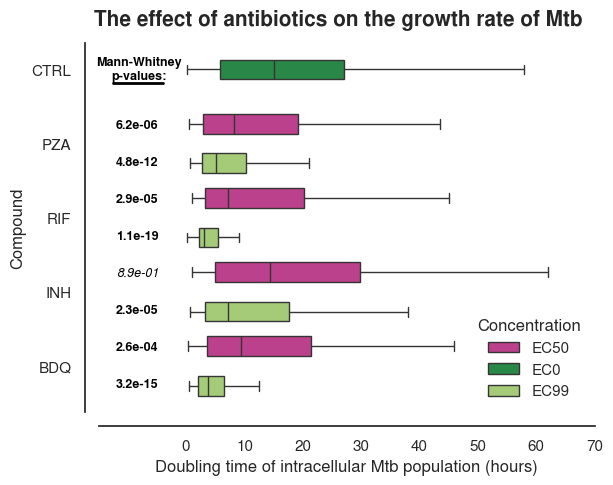

In [319]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os



# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='lower right', frameon=False, title='Concentration')
xlim_min = -15
plt.xlim(xlim_min, 70)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.1e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(x+3, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.1e}'
            plt.annotate(f'{p_text}', xy=(x+3, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min+7, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+2.5, xlim_min+11], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.xticks(np.arange(0, 71, 10))  # Display x-axis labels from 0 to 70 with a step of 10
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0_boxplot_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

## just ec99/50

Compound: PZA, Concentration: EC50, U-statistic: 67634, p-value: 6.190e-06
Compound: RIF, Concentration: EC50, U-statistic: 59944, p-value: 2.887e-05
Compound: INH, Concentration: EC50, U-statistic: 77572, p-value: 8.891e-01
Compound: BDQ, Concentration: EC50, U-statistic: 79247, p-value: 2.635e-04


/tmp/ipykernel_2892626/440250423.py:38: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  g = sns.boxplot(x="dt", y="Compound",


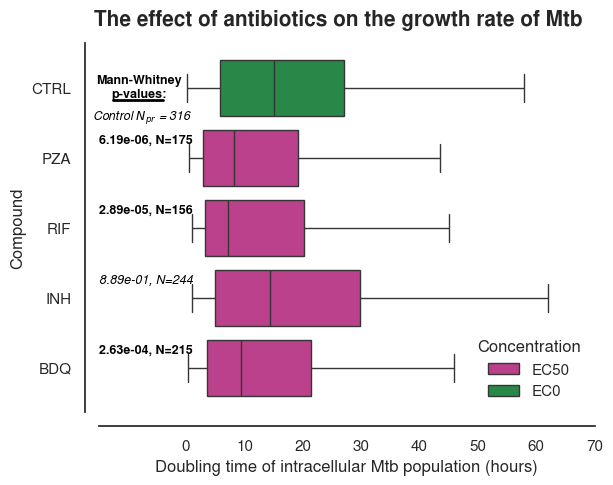

In [667]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os



# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1') & (df['Concentration'] != 'EC99')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=[con for con in hue_order if con != 'EC99'],  # Ensure EC99 is excluded from hue_order
                fliersize=0)  

plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='lower right', frameon=False, title='Concentration')
xlim_min = -15
plt.xlim(xlim_min, 70)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min+7, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+2.5, xlim_min+11], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=9, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, 71, 10))  # Display x-axis labels from 0 to 70 with a step of 10
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0_boxplot_EC50_stats_withN.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

Compound: PZA, Concentration: EC99, U-statistic: 49488, p-value: 4.834e-12
Compound: RIF, Concentration: EC99, U-statistic: 37600, p-value: 1.073e-19
Compound: INH, Concentration: EC99, U-statistic: 62933, p-value: 2.296e-05
Compound: BDQ, Concentration: EC99, U-statistic: 31466, p-value: 3.216e-15


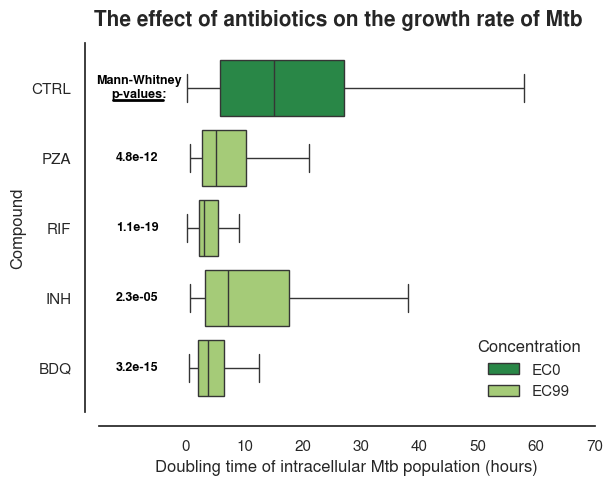

In [605]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os



# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1') & (df['Concentration'] != 'EC50')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[0], expanded_piyg[1]],#, expanded_piyg[1]],
                data=subset_df, 
                hue_order=[con for con in hue_order if con != 'EC50'],  # Ensure EC99 is excluded from hue_order
                fliersize=0)  

plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='lower right', frameon=False, title='Concentration')
xlim_min = -15
plt.xlim(xlim_min, 70)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'{p_text}, N={len(positions)}', xy=(x+0.02, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=9, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min+7, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+2.5, xlim_min+11], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.xticks(np.arange(0, 71, 10))  # Display x-axis labels from 0 to 70 with a step of 10
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0_boxplot_EC99_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

Compound: PZA, Concentration: EC50, U-statistic: 42965, p-value: 6.190e-06
Compound: RIF, Concentration: EC50, U-statistic: 38647, p-value: 2.887e-05
Compound: INH, Concentration: EC50, U-statistic: 76635, p-value: 8.891e-01
Compound: BDQ, Concentration: EC50, U-statistic: 56633, p-value: 2.635e-04


/tmp/ipykernel_2892626/3946831387.py:38: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  g = sns.boxplot(x="reciprocal_dt", y="Compound",


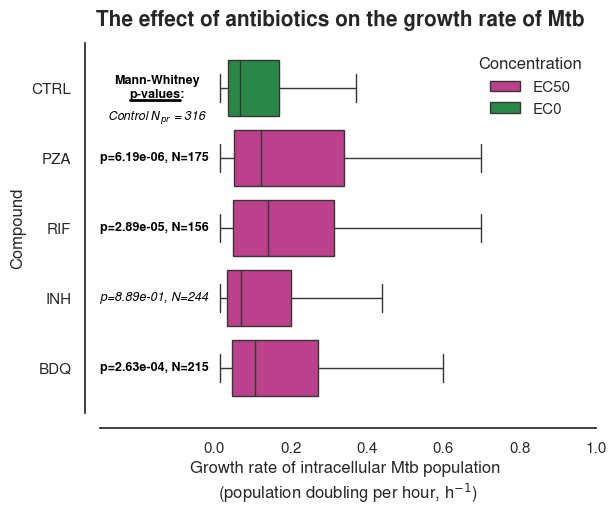

In [689]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1') & (df['Concentration'] != 'EC99')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=[con for con in hue_order if con != 'EC99'], fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
plt.xlim(xlim_min, 1)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.0, y ), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.0, y), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
# plt.plot([xlim_min+0.015, xlim_min+0.14], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=9, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, 1.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10
plt.plot([-0.22, -0.09], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title

plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_boxplot_EC50_stats_withN.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()


Compound: PZA, Concentration: EC99, U-statistic: 20664, p-value: 4.834e-12
Compound: RIF, Concentration: EC99, U-statistic: 7903, p-value: 1.073e-19
Compound: INH, Concentration: EC99, U-statistic: 40715, p-value: 2.296e-05
Compound: BDQ, Concentration: EC99, U-statistic: 7717, p-value: 3.216e-15


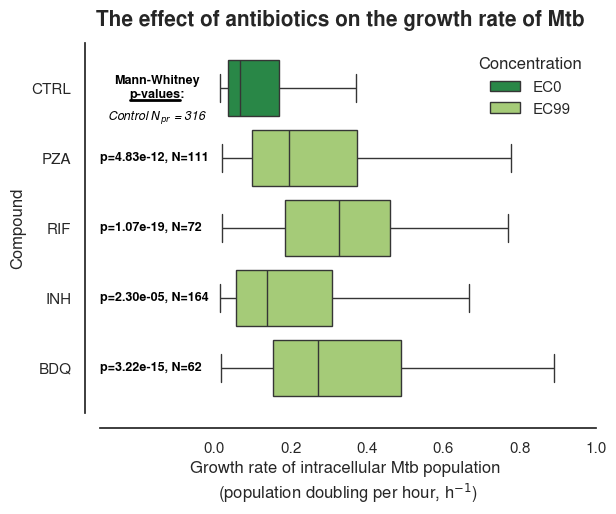

In [690]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1') & (df['Concentration'] != 'EC50')].drop_duplicates(subset=['ID'])

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL']['reciprocal_dt']

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]['reciprocal_dt']
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x="reciprocal_dt", y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[0], expanded_piyg[1]],# expanded_piyg[1]],
                data=subset_df, 
                hue_order=[con for con in hue_order if con != 'EC50'], fliersize=0)  

sns.despine(offset=10)
plt.xlabel("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=11)
plt.legend(loc='upper right', frameon=False, title='Concentration')


xlim_min = -0.3
plt.xlim(xlim_min, 1)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.2e}'# Italicize p-values below 0.1
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.0, y ), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.2e}'
            plt.annotate(f'p={p_text}, N={len(positions)}', xy=(x+0.0, y), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
# plt.plot([xlim_min+0.015, xlim_min+0.14], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.annotate(f'Control $N_{{pr}}$ = {len(control_data) // 2}', xy=(xlim_min / 2, 0.45),
                         fontsize=9, color='black', fontweight = 'regular', horizontalalignment = 'center', style = 'italic')

plt.xticks(np.arange(0, 1.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10
plt.plot([-0.22, -0.09], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title


plt.savefig(os.path.join(output_dir, 'ATB_effect_1_over_dt_gt0_boxplot_EC99_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()


## exploring other options 

Compound: PZA, Concentration: EC50, U-statistic: 58584, p-value: 2.199e-01
Compound: PZA, Concentration: EC99, U-statistic: 39980, p-value: 1.656e-02
Compound: RIF, Concentration: EC50, U-statistic: 59118, p-value: 8.105e-05
Compound: RIF, Concentration: EC99, U-statistic: 31756, p-value: 1.775e-08
Compound: INH, Concentration: EC50, U-statistic: 79221, p-value: 5.217e-01
Compound: INH, Concentration: EC99, U-statistic: 60747, p-value: 5.130e-04
Compound: BDQ, Concentration: EC50, U-statistic: 69961, p-value: 5.068e-01
Compound: BDQ, Concentration: EC99, U-statistic: 26665, p-value: 1.627e-06


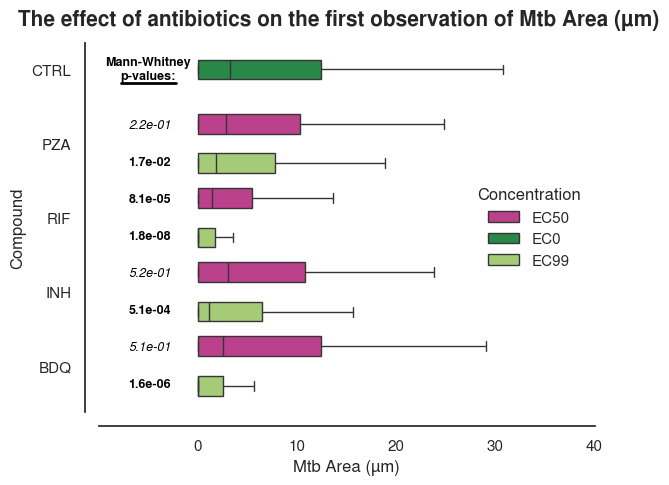

In [565]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

var = 'Mtb Area (µm)'
when = 'first'

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep = when)

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df[var] = pd.to_numeric(subset_df[var], errors='coerce')
subset_df = subset_df.dropna(subset=[var])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL'][var]

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)][var]
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x=var, y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

# plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle(f'The effect of antibiotics on the {when} observation of {var}', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='center right', frameon=False, title='Concentration')
xlim_min = -10
xlim_max = 40
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.1e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(x+3, y + y_offset), xycoords='data',
                             horizontalalignment='left', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.1e}'
            plt.annotate(f'{p_text}', xy=(x+3, y + y_offset), xycoords='data',
                         horizontalalignment='left', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+abs(xlim_min/4.5), -abs(xlim_min/4.5)], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.xticks(np.arange(0, xlim_max+1, 10))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, f'ATB_effect_{var}_{when}_boxplot_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

Compound: PZA, Concentration: EC50, U-statistic: 56105, p-value: 7.681e-01
Compound: PZA, Concentration: EC99, U-statistic: 37386, p-value: 2.681e-01
Compound: RIF, Concentration: EC50, U-statistic: 48982, p-value: 9.020e-01
Compound: RIF, Concentration: EC99, U-statistic: 24939, p-value: 1.811e-01
Compound: INH, Concentration: EC50, U-statistic: 83677, p-value: 5.025e-02
Compound: INH, Concentration: EC99, U-statistic: 57682, p-value: 2.558e-02
Compound: BDQ, Concentration: EC50, U-statistic: 70738, p-value: 3.666e-01
Compound: BDQ, Concentration: EC99, U-statistic: 23202, p-value: 1.657e-02


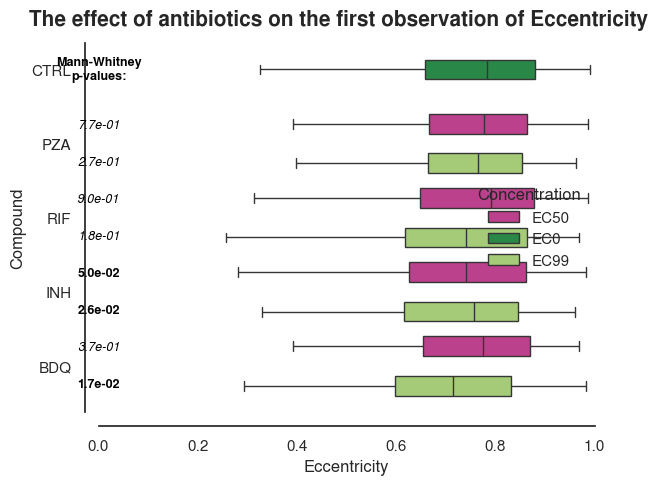

In [718]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np
import os

var = 'Eccentricity'
when = 'first'

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep = when)

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df[var] = pd.to_numeric(subset_df[var], errors='coerce')
subset_df = subset_df.dropna(subset=[var])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL'][var]

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)][var]
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x=var, y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

# plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle(f'The effect of antibiotics on the {when} observation of {var}', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='center right', frameon=False, title='Concentration')
xlim_min = -0
xlim_max = 1
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.1e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(x+abs(xlim_min/2), y + y_offset), xycoords='data',
                             horizontalalignment='center', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.1e}'
            plt.annotate(f'{p_text}', xy=(x+abs(xlim_min/2), y + y_offset), xycoords='data',
                         horizontalalignment='center', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+abs(xlim_min/4.5), -abs(xlim_min/4.5)], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.xticks(np.arange(0, xlim_max+0.1, 0.2))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, f'ATB_effect_{var}_{when}_boxplot_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

In [566]:
df.keys()

Index(['Time (hours)', 'Mtb Area (µm)', 'dMtb Area (µm)', 'Mphi Area (µm)',
       'dMphi Area (µm)', 'Infection Status', 'Initial Infection Status',
       'Final Infection Status', 'x', 'y', 'GFP', 'RFP', 'Eccentricity', 'MSD',
       'Technical Replicate', 'Biological Replicate', 'Strain', 'Compound',
       'Concentration', 'Cell ID', 'Acquisition ID', 'Experiment ID',
       'Unique ID', 'ID', 'dt', 'dts', 'r2', 'T_d', 'dt_dmtb', 'dmtb', 'dts_0',
       'dts_1', 'dts_2', 'dts_3', 'dts_4', 'dmtb_0', 'dmtb_1', 'dmtb_2',
       'dmtb_3', 'dmtb_4', 'dt_0', 'dt_1', 'dt_2', 'dt_3', 'dt_4', 'dt_5',
       'dt_6', 'dmtb_5', 'dmtb_6', 'dt_7', 'dmtb_7', 'dt_8', 'dmtb_8', 'dt_9',
       'dmtb_9', 'dt_10', 'dt_11', 'dmtb_10', 'dmtb_11', 'Strain/Compound',
       'reciprocal_dt', 'Doubling time (hours)', 'Growth rate (1/h)',
       'Displacement (µm)'],
      dtype='object')

Compound: PZA, Concentration: EC50, U-statistic: 135382, p-value: 3.949e-01
Compound: PZA, Concentration: EC99, U-statistic: 128593, p-value: 3.915e-01
Compound: RIF, Concentration: EC50, U-statistic: 129943, p-value: 9.251e-01
Compound: RIF, Concentration: EC99, U-statistic: 96358, p-value: 3.989e-01
Compound: INH, Concentration: EC50, U-statistic: 167191, p-value: 1.948e-03
Compound: INH, Concentration: EC99, U-statistic: 122046, p-value: 3.156e-02
Compound: BDQ, Concentration: EC50, U-statistic: 182871, p-value: 5.063e-10
Compound: BDQ, Concentration: EC99, U-statistic: 78013, p-value: 2.723e-02


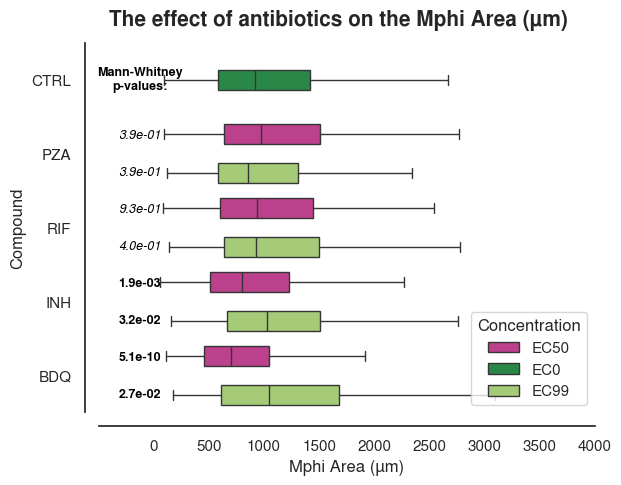

In [707]:
var = 'Mphi Area (µm)'
when = 'last'

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep = when)

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df[var] = pd.to_numeric(subset_df[var], errors='coerce')
subset_df = subset_df.dropna(subset=[var])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL'][var]

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)][var]
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x=var, y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

# plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle(f'The effect of antibiotics on the {var}', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='lower right', frameon=True, title='Concentration')
xlim_min = -500
xlim_max = 4000
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.1e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(xlim_min/4, y + y_offset), xycoords='data',
                             horizontalalignment='center', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.1e}'
            plt.annotate(f'{p_text}', xy=(xlim_min/4, y + y_offset), xycoords='data',
                         horizontalalignment='center', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/4, 0.13),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
# plt.plot([-12, 4], [0.18, 0.18], color='black', lw=2)  # Draw a line under the title
plt.xticks(np.arange(-0, xlim_max+1, 500))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, f'ATB_effect_{var}_{when}_boxplot_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

Compound: PZA, Concentration: EC50, U-statistic: 180353, p-value: 1.297e-14
Compound: PZA, Concentration: EC99, U-statistic: 184210, p-value: 1.637e-34
Compound: RIF, Concentration: EC50, U-statistic: 171895, p-value: 1.583e-16
Compound: RIF, Concentration: EC99, U-statistic: 161847, p-value: 1.026e-47
Compound: INH, Concentration: EC50, U-statistic: 185054, p-value: 2.212e-10
Compound: INH, Concentration: EC99, U-statistic: 182807, p-value: 1.278e-22
Compound: BDQ, Concentration: EC50, U-statistic: 183633, p-value: 2.063e-10
Compound: BDQ, Concentration: EC99, U-statistic: 142031, p-value: 1.971e-45


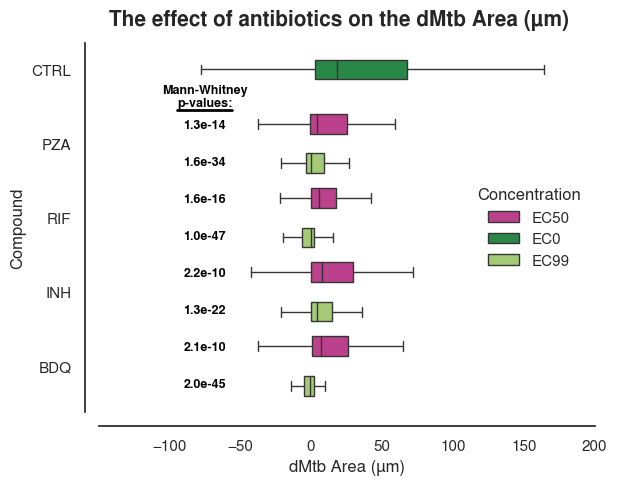

In [590]:

var = 'dMtb Area (µm)'
when = 'last'

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep = when)

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df[var] = pd.to_numeric(subset_df[var], errors='coerce')
subset_df = subset_df.dropna(subset=[var])


# Perform the Mann-Whitney U test for each compound and concentration against the control
control_data = subset_df[subset_df['Compound'] == 'CTRL'][var]

# List to store p-values
p_values = []

for compound in subset_df['Compound'].unique():
    if compound != 'CTRL':
        for concentration in subset_df['Concentration'].unique():
            compound_data = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)][var]
            if not compound_data.empty:
                stat, p_value = mannwhitneyu(control_data, compound_data)
                p_values.append((compound, concentration, stat, p_value))
                print(f"Compound: {compound}, Concentration: {concentration}, U-statistic: {int(stat)}, p-value: {p_value:.3e}")

# Plot the data using the reciprocal of dt
g = sns.boxplot(x=var, y="Compound",
                hue="Concentration", 
                palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
                data=subset_df, 
                hue_order=hue_order, fliersize=0)  

# plt.xlabel("Doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle(f'The effect of antibiotics on the {var}', 
                   fontsize=15, fontweight='bold', 
                   y=0.95)
sns.despine(offset=10)
plt.legend(loc='center right', frameon=False, title='Concentration')
xlim_min = -150
xlim_max = 200
plt.xlim(xlim_min, xlim_max)

# Annotate p-values on the plot
for i, (compound, concentration, stat, p_value) in enumerate(p_values):   
    positions = subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == concentration)]
    if not positions.empty:
        x = xlim_min # positions['dt'].quantile(0.75) + 1.5 * (positions['dt'].quantile(0.75) - positions['dt'].quantile(0.25))  # position of the end of the whisker
        y = list(subset_df['Compound'].unique()).index(compound)
        y_offset = hue_order.index(concentration) * 0.25 - 0.25  # Adjust this multiplier to better space annotations
        if p_value < 0.1:
            p_text = f'{p_value:.1e}'# Italicize p-values below 0.1
            plt.annotate(f'{p_text}', xy=(x+abs(xlim_min/2), y + y_offset), xycoords='data',
                             horizontalalignment='center', verticalalignment='center',
                             fontsize=9, color='black', fontweight = 'bold')
        else:
            p_text = f'{p_value:.1e}'
            plt.annotate(f'{p_text}', xy=(x+abs(xlim_min/2), y + y_offset), xycoords='data',
                         horizontalalignment='center', verticalalignment='center',
                         fontsize=9, color='black', style = 'italic')
# print the p value column title
plt.annotate(f'Mann-Whitney\np-values:', xy=(xlim_min/2, 0.5),
                         fontsize=9, color='black', fontweight = 'bold', horizontalalignment = 'center')
plt.plot([xlim_min+abs(xlim_min/2.7), -abs(xlim_min/2.7)], [0.55, 0.55], color='black', lw=2)  # Draw a line under the title
plt.xticks(np.arange(-100, xlim_max+1, 50))  # Display x-axis labels from 0 to 70 with a step of 10

plt.savefig(os.path.join(output_dir, f'ATB_effect_{var}_boxplot_stats.png'), bbox_inches='tight', dpi=314)

# Display the plot
plt.show()

### could look at correlations

In [559]:
xlim_min+abs(xlim_min/2), -abs(xlim_min/2)

(-30.0, -30.0)

In [345]:
# Create a new column for the reciprocal of dt
df['Growth rate (1/h)'] = df['reciprocal_dt']


,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,y,...,dt_8,dmtb_8,dt_9,dmtb_9,dt_10,dt_11,dmtb_10,dmtb_11,Strain/Compound,reciprocal_dt
13363,0.0,0.000000,104.970726,362.313267,259.845569,0.0,0.0,1.0,1008.739197,13.598442,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CTRL,0.350000
13660,0.0,3.106436,25.968913,611.811498,-142.739627,1.0,1.0,1.0,139.825455,57.281265,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CTRL,0.161290
14259,0.0,0.000000,87.516578,719.486388,356.659106,0.0,0.0,1.0,751.316956,113.828819,...,17.0,33.572523,NaN,NaN,NaN,NaN,NaN,NaN,CTRL,0.257143
14484,0.0,1.765529,146.516517,1430.547407,-621.264898,1.0,1.0,1.0,817.240356,151.632904,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CTRL,0.157895
14707,0.0,26.594670,65.905615,7416.604980,1632.823337,1.0,1.0,1.0,730.867371,215.965302,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CTRL,0.017544
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1507479,35.0,1.765528,0.089394,1330.850952,-625.332318,1.0,1.0,1.0,148.010040,530.307495,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BDQ,0.090909
1508371,37.5,3.374618,9.878020,249.475882,546.129368,1.0,1.0,1.0,369.286743,35.451763,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BDQ,0.146341
1508450,37.5,0.424621,23.331794,210.209634,121.240407,1.0,1.0,1.0,223.019058,8.987488,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BDQ,0.080000
1508529,37.5,3.061739,-0.514015,313.660665,4.179162,1.0,1.0,1.0,79.019554,501.492554,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BDQ,0.204082


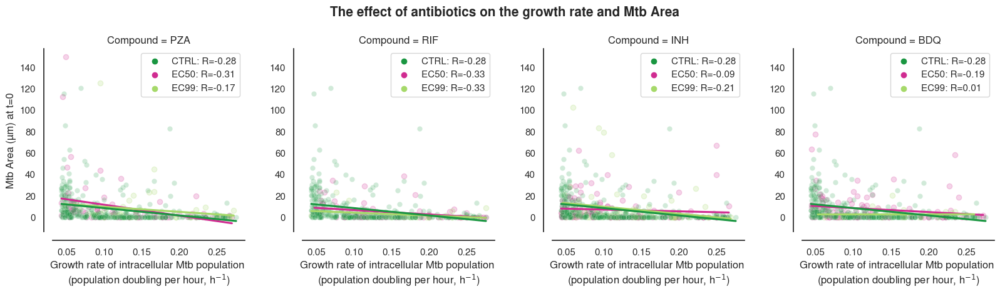

In [492]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import pearsonr
import numpy as np
import os

y_var = 'Mtb Area (µm)'
# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep='first')

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Calculate the IQR for reciprocal_dt
Q1 = subset_df['reciprocal_dt'].quantile(0.25)
Q3 = subset_df['reciprocal_dt'].quantile(0.75)
IQR = Q3 - Q1

# Filter the data to include only the values within the IQR
iqr_filtered_df = subset_df[(subset_df['reciprocal_dt'] >= Q1) & (subset_df['reciprocal_dt'] <= Q3)]

# Separate control data
control_data = iqr_filtered_df[iqr_filtered_df['Compound'] == 'CTRL']
iqr_filtered_df = iqr_filtered_df[iqr_filtered_df['Compound'] != 'CTRL']  # Exclude control data from the main data

# Create the FacetGrid without the control data
g = sns.FacetGrid(iqr_filtered_df, 
                  col="Compound", 
                  hue="Concentration", 
                  palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], 
                  hue_order=hue_order, 
                  aspect=1, height=4, col_wrap=4,)

# Map the scatterplot for each compound with a line of best fit
g.map_dataframe(sns.regplot, x="reciprocal_dt", y=y_var, ci=None, scatter_kws={'alpha':0.2})

# Add the control data to each subplot and include line of best fit and R score for control
for ax in g.axes.flat:
    sns.scatterplot(x='reciprocal_dt', y=y_var, data=control_data, color=expanded_piyg[0], ax=ax, label='CTRL', alpha=0.2)
    sns.regplot(x='reciprocal_dt', y=y_var, data=control_data, ax=ax, scatter=False, color=expanded_piyg[0], ci=None)

x_ctrl = control_data['reciprocal_dt']
y_ctrl = control_data[y_var]
corr_ctrl, _ = pearsonr(x_ctrl, y_ctrl)

# Calculate and annotate correlation coefficients on each subplot
for ax in g.axes.flat:
    compound = ax.get_title().replace('Compound = ', '')
    annotations = []
    handles, labels = [], []
    # Add the handle and label for the control data first
    handles.append(ax.scatter([], [], label='CTRL', color=expanded_piyg[0]))
    labels.append(f'CTRL: R={corr_ctrl:.2f}')
    for concentration in hue_order:
        positions = iqr_filtered_df[(iqr_filtered_df['Compound'] == compound) & (iqr_filtered_df['Concentration'] == concentration)]
        if not positions.empty:
            x = positions['reciprocal_dt']
            y = positions[y_var]
            corr, _ = pearsonr(x, y)
            corr_text = f'{concentration}: R={corr:.2f}'
            annotations.append(corr_text)
            # Add the handle and label for the legend
            color_index = hue_order.index(concentration)
            handle = ax.scatter([], [], label=corr_text, color=[expanded_piyg[-1], expanded_piyg[2], expanded_piyg[1]][color_index])
            handles.append(handle)
            labels.append(corr_text)
    
    # Create a custom legend for each subplot including the control
    ax.legend(handles=handles, labels=labels, frameon=True)

# Add axis labels and title
g.set_axis_labels("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)", f'{y_var} at t=0')
g.fig.subplots_adjust(top=0.9, wspace=0.3)  # Adjust wspace to add lateral padding
g.fig.suptitle('The effect of antibiotics on the growth rate and Mtb Area', fontsize=15, fontweight='bold', y=1.07)

# Apply sns.despine() to each subplot after they have been created
for ax in g.axes.flat:
    sns.despine(ax=ax, offset = 10)

plt.savefig(os.path.join(output_dir, 'misc/ATB_effect_1_over_dt_gt0_vs_Mtb_area_t0.png'), bbox_inches='tight', dpi=314)

plt.show()


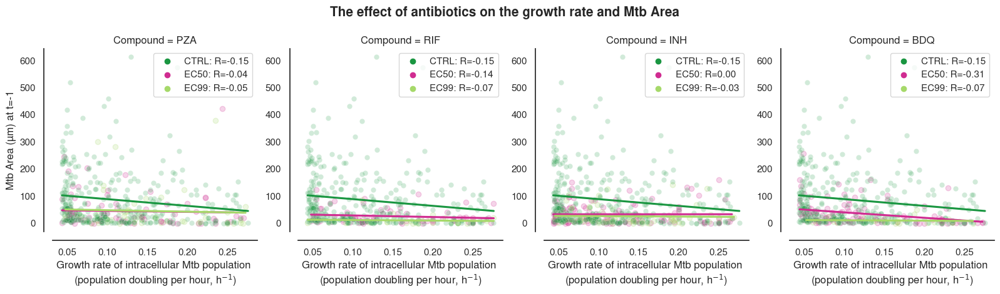

In [509]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import pearsonr
import numpy as np

y_var = 'Mtb Area (µm)'
# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep='last')

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Calculate the IQR for reciprocal_dt
Q1 = subset_df['reciprocal_dt'].quantile(0.25)
Q3 = subset_df['reciprocal_dt'].quantile(0.75)
IQR = Q3 - Q1

# Filter the data to include only the values within the IQR
iqr_filtered_df = subset_df[(subset_df['reciprocal_dt'] >= Q1) & (subset_df['reciprocal_dt'] <= Q3)]

# Separate control data
control_data = iqr_filtered_df[iqr_filtered_df['Compound'] == 'CTRL']
iqr_filtered_df = iqr_filtered_df[iqr_filtered_df['Compound'] != 'CTRL']  # Exclude control data from the main data

# Create the FacetGrid without the control data
g = sns.FacetGrid(iqr_filtered_df, 
                  col="Compound", 
                  hue="Concentration", 
                  palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], 
                  hue_order=hue_order, 
                  aspect=1, height=4, col_wrap=4)

# Map the scatterplot for each compound with a line of best fit
g.map_dataframe(sns.regplot, x="reciprocal_dt", y=y_var, ci=None, scatter_kws={'alpha':0.2})

# Add the control data to each subplot and include line of best fit and R score for control
for ax in g.axes.flat:
    sns.scatterplot(x='reciprocal_dt', y=y_var, data=control_data, color=expanded_piyg[0], ax=ax, label='CTRL', alpha=0.2)
    sns.regplot(x='reciprocal_dt', y=y_var, data=control_data, ax=ax, scatter=False, color=expanded_piyg[0], ci = None)

x_ctrl = control_data['reciprocal_dt']
y_ctrl = control_data[y_var]
corr_ctrl, _ = pearsonr(x_ctrl, y_ctrl)

# Calculate and annotate correlation coefficients on each subplot
for ax in g.axes.flat:
    compound = ax.get_title().replace('Compound = ', '')
    annotations = []
    handles, labels = [], []
    # Add the handle and label for the control data first
    handles.append(ax.scatter([], [], label=corr_text_ctrl, color=expanded_piyg[0]))
    labels.append(f'CTRL: R={corr_ctrl:.2f}')
    for concentration in hue_order:
        positions = iqr_filtered_df[(iqr_filtered_df['Compound'] == compound) & (iqr_filtered_df['Concentration'] == concentration)]
        if not positions.empty:
            x = positions['reciprocal_dt']
            y = positions[y_var]
            corr, _ = pearsonr(x, y)
            corr_text = f'{concentration}: R={corr:.2f}'
            annotations.append(corr_text)
            # Add the handle and label for the legend
            color_index = hue_order.index(concentration)
            handle = ax.scatter([], [], label=corr_text, color=[expanded_piyg[-1], expanded_piyg[2], expanded_piyg[1]][color_index])
            handles.append(handle)
            labels.append(corr_text)
    
    # Create a custom legend for each subplot including the control
    ax.legend(handles=handles, labels=labels, frameon=True)

# Add axis labels and title
g.set_axis_labels("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)", f'{y_var} at t=-1')
g.fig.subplots_adjust(top=0.9, wspace=0.2)  # Adjust wspace to add lateral padding
g.fig.suptitle('The effect of antibiotics on the growth rate and Mtb Area', fontsize=15, fontweight='bold', y=1.07)

# Apply sns.despine() to each subplot after they have been created
for ax in g.axes.flat:
    sns.despine(ax=ax, offset = 10)
    
plt.savefig(os.path.join(output_dir, 'misc/ATB_effect_1_over_dt_gt0_vs_Mtb_area_t-1.png'), bbox_inches='tight', dpi=314)


plt.show()


### motility

In [510]:
# Sort the data by ID and time
subset_df = df.sort_values(by=['ID', 'Time (hours)'])

# Calculate the differences in coordinates
subset_df['x_diff'] = subset_df.groupby('ID')['x'].diff().fillna(0)
subset_df['y_diff'] = subset_df.groupby('ID')['y'].diff().fillna(0)

# Calculate the time difference
subset_df['time_diff'] = subset_df.groupby('ID')['Time (hours)'].diff().fillna(0)

# Calculate the Euclidean distance in pixels
subset_df['distance_pixels'] = np.sqrt(subset_df['x_diff']**2 + subset_df['y_diff']**2)

# Convert the distance from pixels to micrometers
subset_df['distance_micrometers'] = subset_df['distance_pixels'] * micrometers_per_pixel

# Normalize the distance by the time difference to get velocity (micrometers per hour)
subset_df['velocity'] = subset_df['distance_micrometers'] / subset_df['time_diff']

# Calculate the total motility for each cell by summing the distances, ignoring zero time differences
motility_df = subset_df[subset_df['time_diff'] > 0].groupby('ID')['distance_micrometers'].sum().reset_index()
motility_df = motility_df.rename(columns={'distance_micrometers': 'Displacement (µm)'})

# Display the motility for each cell
print(motility_df)

# Merge motility information back into the main DataFrame
df = df.merge(motility_df, on='ID')


                    ID  Displacement (µm)
0        1.3.12.ND0003          59.684769
1         1.3.2.ND0002          80.806367
2         1.3.2.ND0003          57.574554
3         1.3.3.ND0003          49.030579
4         1.3.5.PS0000          53.116843
...                ...                ...
12678  995.3.11.ND0003          54.901573
12679   995.4.5.ND0003          54.485452
12680   995.4.9.ND0003          62.713747
12681   996.4.5.PS0000          36.108673
12682   997.3.5.ND0002          82.725981

[12683 rows x 2 columns]


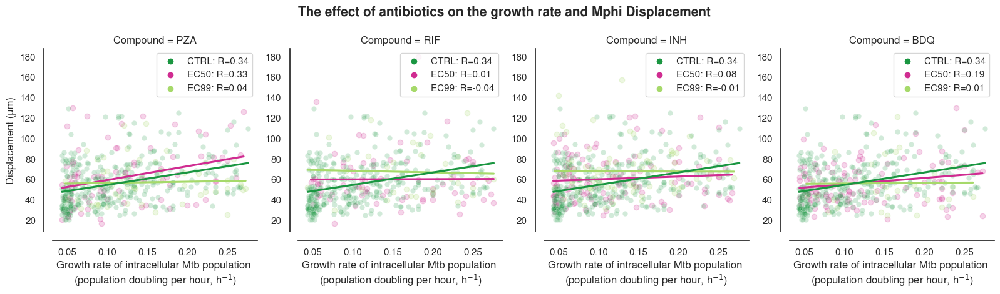

In [517]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import pearsonr
import numpy as np

y_var = 'Displacement (µm)'
# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep='first')

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Calculate the IQR for reciprocal_dt
Q1 = subset_df['reciprocal_dt'].quantile(0.25)
Q3 = subset_df['reciprocal_dt'].quantile(0.75)
IQR = Q3 - Q1

# Filter the data to include only the values within the IQR
iqr_filtered_df = subset_df[(subset_df['reciprocal_dt'] >= Q1) & (subset_df['reciprocal_dt'] <= Q3)]

# Separate control data
control_data = iqr_filtered_df[iqr_filtered_df['Compound'] == 'CTRL']
iqr_filtered_df = iqr_filtered_df[iqr_filtered_df['Compound'] != 'CTRL']  # Exclude control data from the main data

# Create the FacetGrid without the control data
g = sns.FacetGrid(iqr_filtered_df, 
                  col="Compound", 
                  hue="Concentration", 
                  palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], 
                  hue_order=hue_order, 
                  aspect=1, height=4, col_wrap=4)

# Map the scatterplot for each compound with a line of best fit
g.map_dataframe(sns.regplot, x="reciprocal_dt", y=y_var, ci=None, scatter_kws={'alpha':0.2})

# Add the control data to each subplot and include line of best fit and R score for control
for ax in g.axes.flat:
    sns.scatterplot(x='reciprocal_dt', y=y_var, data=control_data, color=expanded_piyg[0], ax=ax, label='CTRL', alpha=0.2)
    sns.regplot(x='reciprocal_dt', y=y_var, data=control_data, ax=ax, scatter=False, color=expanded_piyg[0], ci = None)

x_ctrl = control_data['reciprocal_dt']
y_ctrl = control_data[y_var]
corr_ctrl, _ = pearsonr(x_ctrl, y_ctrl)


# Calculate and annotate correlation coefficients on each subplot
for ax in g.axes.flat:
    compound = ax.get_title().replace('Compound = ', '')
    annotations = []
    handles, labels = [], []
    # Add the handle and label for the control data first
    handles.append(ax.scatter([], [], label='CTRL', color=expanded_piyg[0]))
    labels.append(f'CTRL: R={corr_ctrl:.2f}')
    for concentration in hue_order:
        positions = iqr_filtered_df[(iqr_filtered_df['Compound'] == compound) & (iqr_filtered_df['Concentration'] == concentration)]
        if not positions.empty:
            x = positions['reciprocal_dt']
            y = positions[y_var]
            corr, _ = pearsonr(x, y)
            corr_text = f'{concentration}: R={corr:.2f}'
            annotations.append(corr_text)
            # Add the handle and label for the legend
            color_index = hue_order.index(concentration)
            handle = ax.scatter([], [], label=corr_text, color=[expanded_piyg[-1], expanded_piyg[2], expanded_piyg[1]][color_index])
            handles.append(handle)
            labels.append(corr_text)
    
    # Create a custom legend for each subplot including the control
    ax.legend(handles=handles, labels=labels, frameon=True, loc= 'upper right')

# Add axis labels and title
g.set_axis_labels("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)", y_var)
g.fig.subplots_adjust(top=0.9, wspace=0.2)  # Adjust wspace to add lateral padding

# Apply sns.despine() to each subplot after they have been created
for ax in g.axes.flat:
    sns.despine(ax=ax, offset = 10)
    
g.fig.suptitle('The effect of antibiotics on the growth rate and Mphi Displacement', fontsize=15, fontweight='bold', y=1.07)

plt.savefig(os.path.join(output_dir, 'misc/ATB_effect_1_over_dt_gt0_vs_Mphi_displacement.png'), bbox_inches='tight', dpi=314)


plt.show()


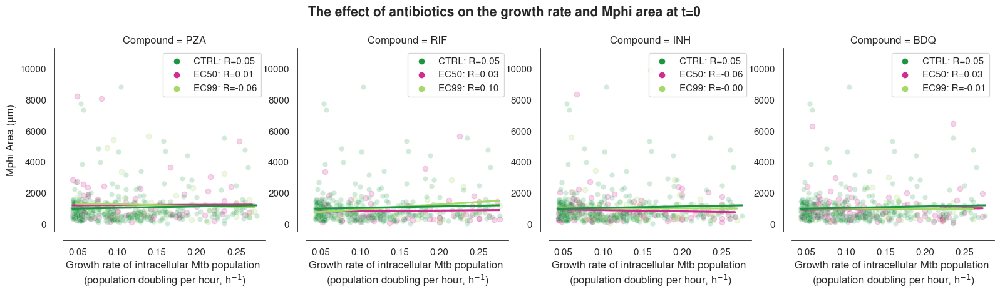

In [519]:
y_var = 'Mphi Area (µm)'
# Assuming expanded_piyg and hue_order are defined elsewhere in your code
# expanded_piyg = ...
# hue_order = ...

# Subset your data and remove duplicates based on Unique_ID
subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep='first')

# Ensure 'dt' is numeric and drop rows with NaNs in 'dt'
subset_df['dt'] = pd.to_numeric(subset_df['dt'], errors='coerce')
subset_df = subset_df.dropna(subset=['dt'])

# Create a new column for the reciprocal of dt
subset_df['reciprocal_dt'] = 1 / subset_df['dt']

# Calculate the IQR for reciprocal_dt
Q1 = subset_df['reciprocal_dt'].quantile(0.25)
Q3 = subset_df['reciprocal_dt'].quantile(0.75)
IQR = Q3 - Q1

# Filter the data to include only the values within the IQR
iqr_filtered_df = subset_df[(subset_df['reciprocal_dt'] >= Q1) & (subset_df['reciprocal_dt'] <= Q3)]

# Separate control data
control_data = iqr_filtered_df[iqr_filtered_df['Compound'] == 'CTRL']
iqr_filtered_df = iqr_filtered_df[iqr_filtered_df['Compound'] != 'CTRL']  # Exclude control data from the main data

# Create the FacetGrid without the control data
g = sns.FacetGrid(iqr_filtered_df, 
                  col="Compound", 
                  hue="Concentration", 
                  palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], 
                  hue_order=hue_order, 
                  aspect=1, height=4, col_wrap=4)

# Map the scatterplot for each compound with a line of best fit
g.map_dataframe(sns.regplot, x="reciprocal_dt", y=y_var, ci=None, scatter_kws={'alpha':0.2})

# Add the control data to each subplot and include line of best fit and R score for control
for ax in g.axes.flat:
    sns.scatterplot(x='reciprocal_dt', y=y_var, data=control_data, color=expanded_piyg[0], ax=ax, label='CTRL', alpha=0.2)
    sns.regplot(x='reciprocal_dt', y=y_var, data=control_data, ax=ax, scatter=False, color=expanded_piyg[0], ci = None)

x_ctrl = control_data['reciprocal_dt']
y_ctrl = control_data[y_var]
corr_ctrl, _ = pearsonr(x_ctrl, y_ctrl)


# Calculate and annotate correlation coefficients on each subplot
for ax in g.axes.flat:
    compound = ax.get_title().replace('Compound = ', '')
    annotations = []
    handles, labels = [], []
    # Add the handle and label for the control data first
    handles.append(ax.scatter([], [], label='CTRL', color=expanded_piyg[0]))
    labels.append(f'CTRL: R={corr_ctrl:.2f}')
    for concentration in hue_order:
        positions = iqr_filtered_df[(iqr_filtered_df['Compound'] == compound) & (iqr_filtered_df['Concentration'] == concentration)]
        if not positions.empty:
            x = positions['reciprocal_dt']
            y = positions[y_var]
            corr, _ = pearsonr(x, y)
            corr_text = f'{concentration}: R={corr:.2f}'
            annotations.append(corr_text)
            # Add the handle and label for the legend
            color_index = hue_order.index(concentration)
            handle = ax.scatter([], [], label=corr_text, color=[expanded_piyg[-1], expanded_piyg[2], expanded_piyg[1]][color_index])
            handles.append(handle)
            labels.append(corr_text)
    
    # Create a custom legend for each subplot including the control
    ax.legend(handles=handles, labels=labels, frameon=True, loc= 'upper right')

# Add axis labels and title
g.set_axis_labels("Growth rate of intracellular Mtb population \n(population doubling per hour, h$^{-1}$)", y_var)
g.fig.subplots_adjust(top=0.9, wspace=0.2)  # Adjust wspace to add lateral padding

for ax in g.axes.flat:
    sns.despine(ax=ax, offset = 10)
    
g.fig.suptitle('The effect of antibiotics on the growth rate and Mphi area at t=0', fontsize=15, fontweight='bold', y=1.07)

plt.savefig(os.path.join(output_dir, 'misc/ATB_effect_1_over_dt_gt0_vs_Mphi_area_t0.png'), bbox_inches='tight', dpi=314)


plt.show()

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

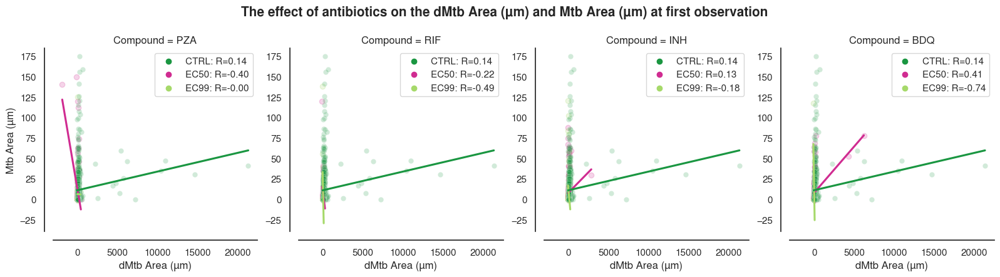

<Figure size 640x480 with 0 Axes>

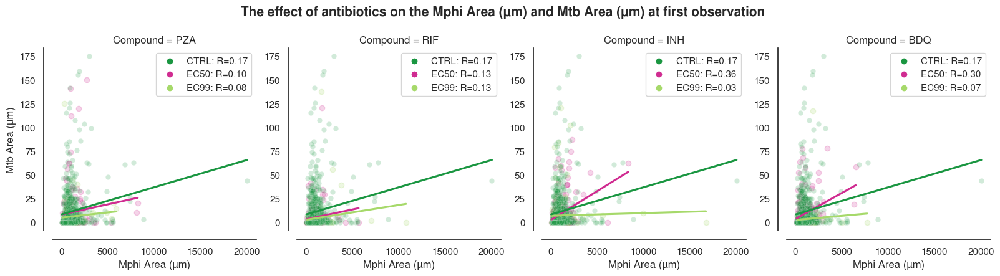

<Figure size 640x480 with 0 Axes>

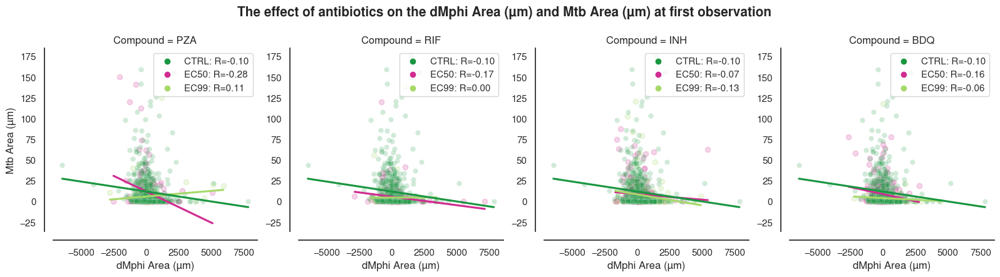

<Figure size 640x480 with 0 Axes>

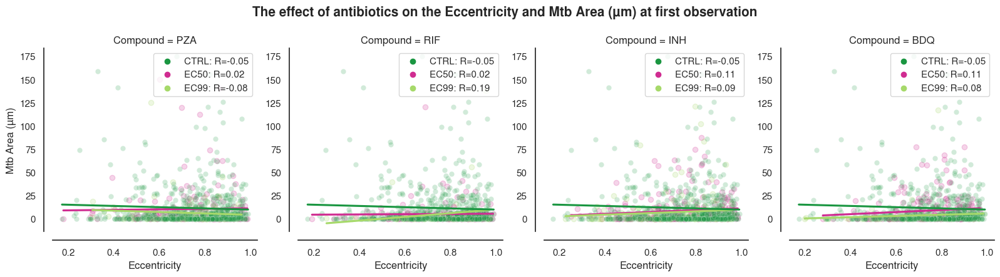

<Figure size 640x480 with 0 Axes>

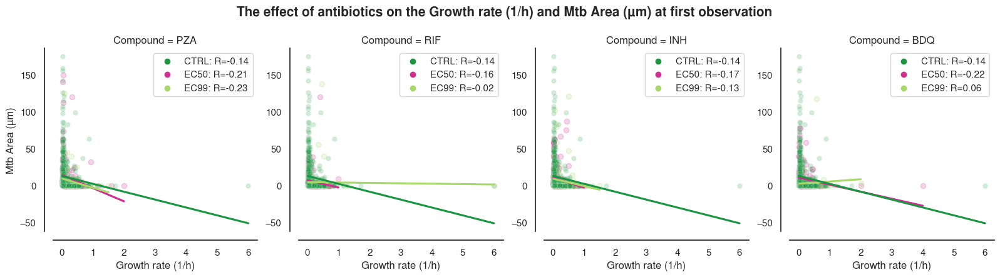

<Figure size 640x480 with 0 Axes>

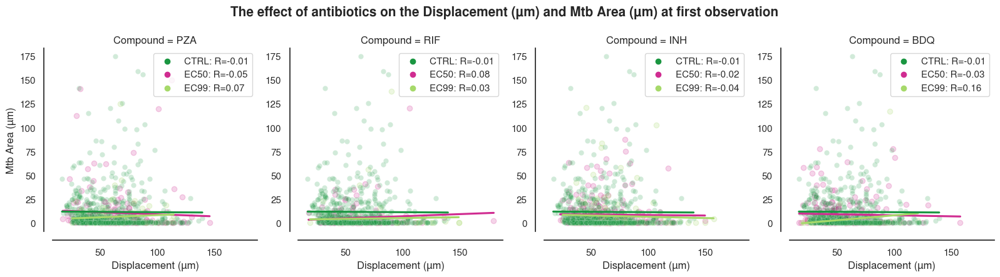

<Figure size 640x480 with 0 Axes>

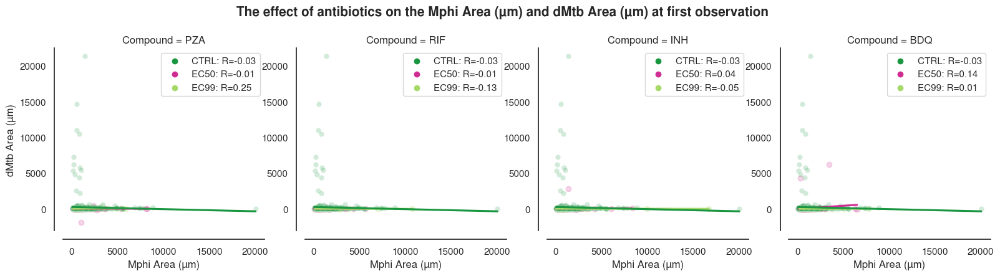

<Figure size 640x480 with 0 Axes>

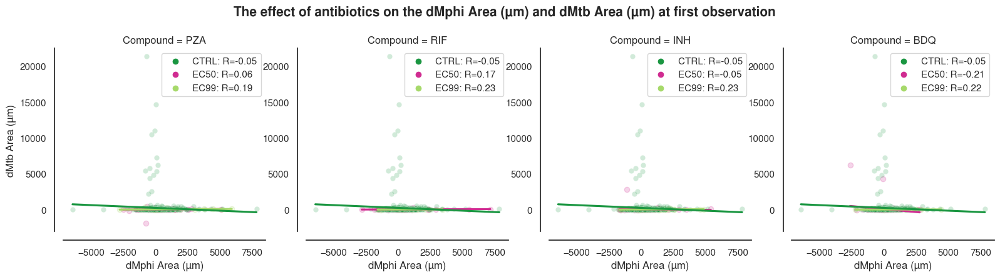

<Figure size 640x480 with 0 Axes>

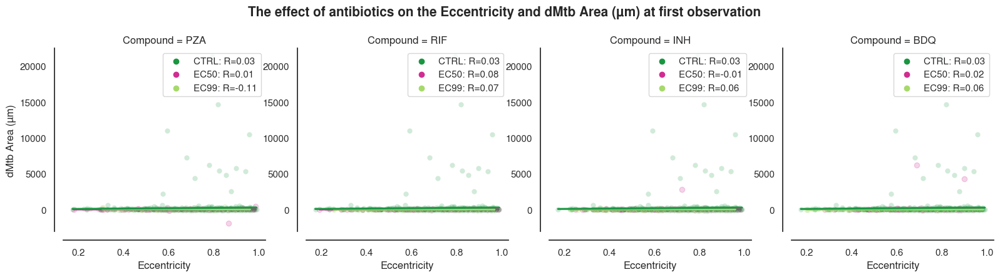

<Figure size 640x480 with 0 Axes>

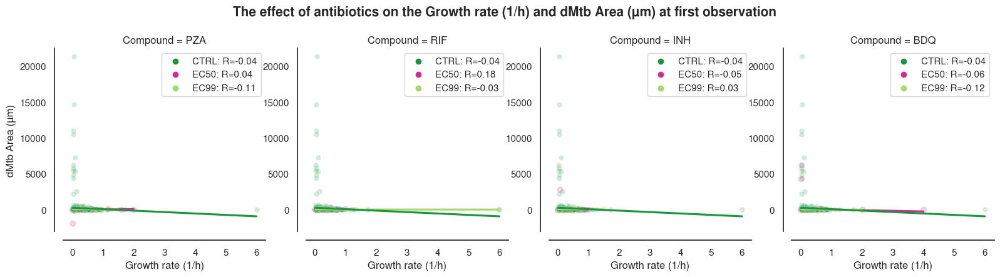

<Figure size 640x480 with 0 Axes>

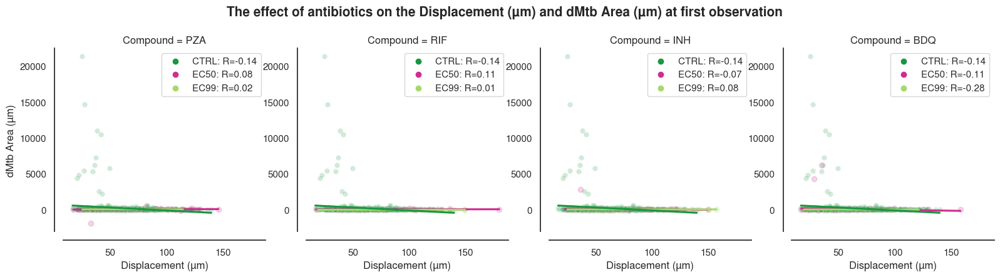

<Figure size 640x480 with 0 Axes>

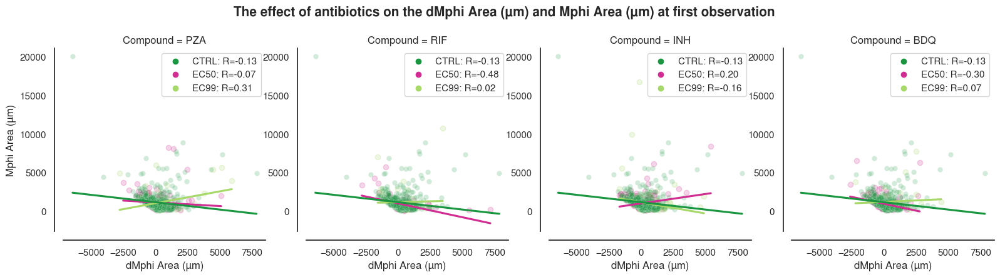

<Figure size 640x480 with 0 Axes>

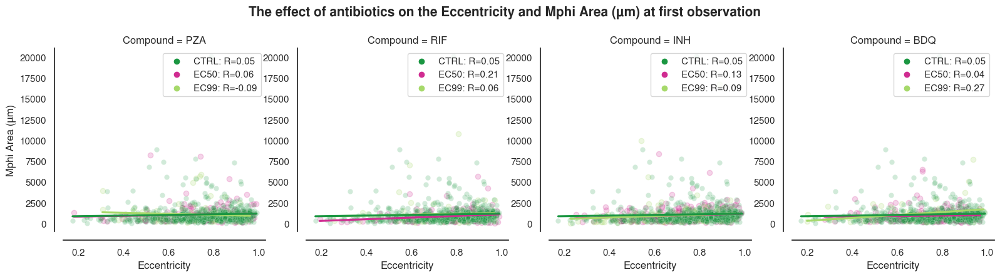

<Figure size 640x480 with 0 Axes>

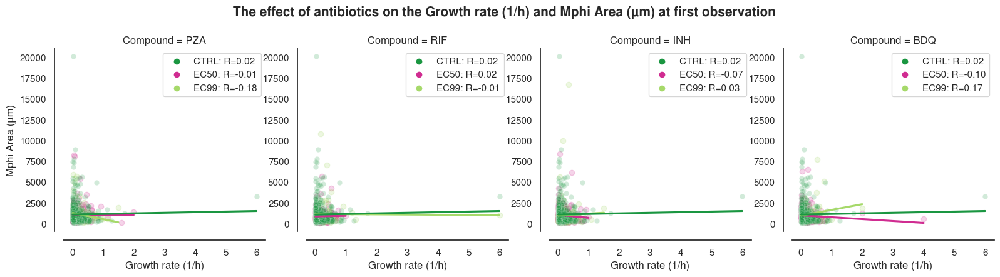

<Figure size 640x480 with 0 Axes>

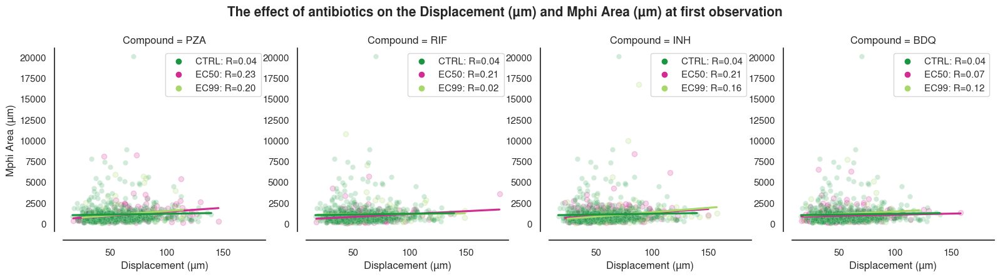

<Figure size 640x480 with 0 Axes>

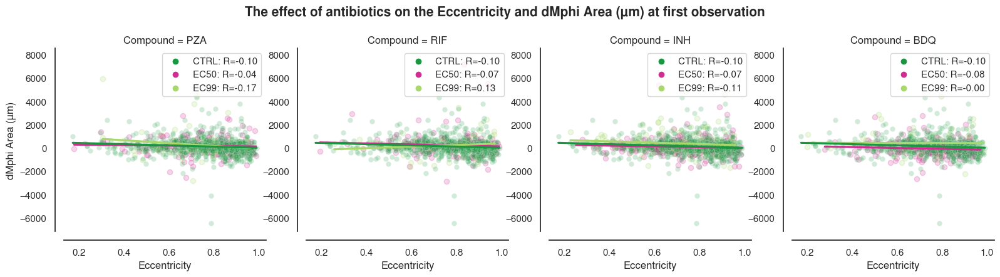

<Figure size 640x480 with 0 Axes>

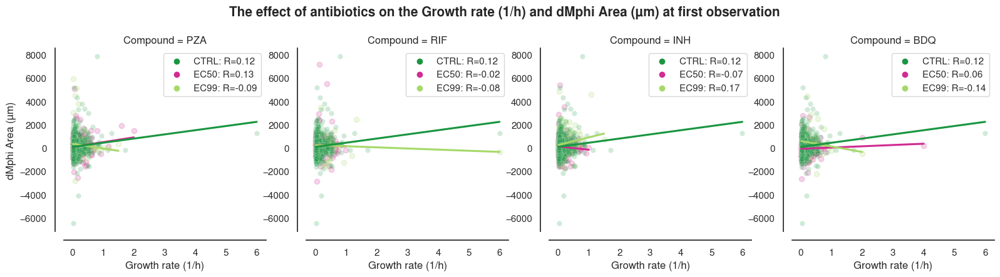

<Figure size 640x480 with 0 Axes>

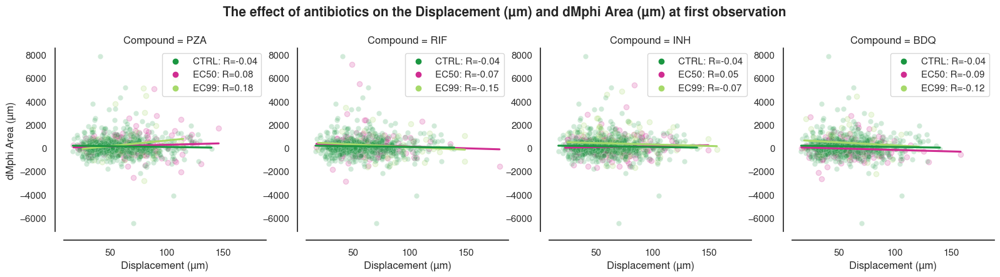

<Figure size 640x480 with 0 Axes>

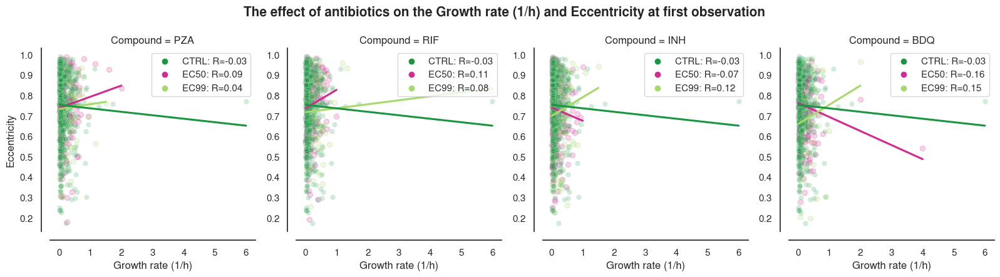

<Figure size 640x480 with 0 Axes>

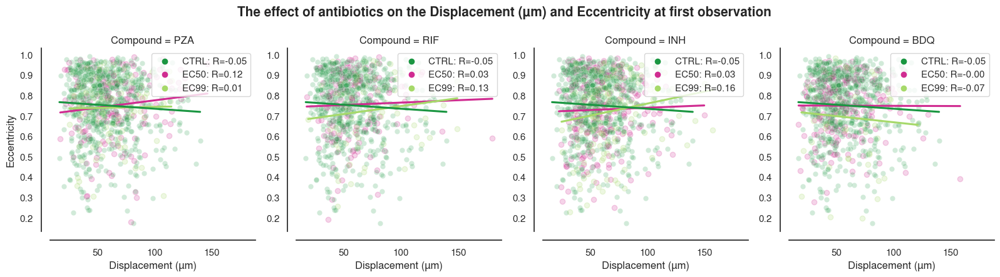

<Figure size 640x480 with 0 Axes>

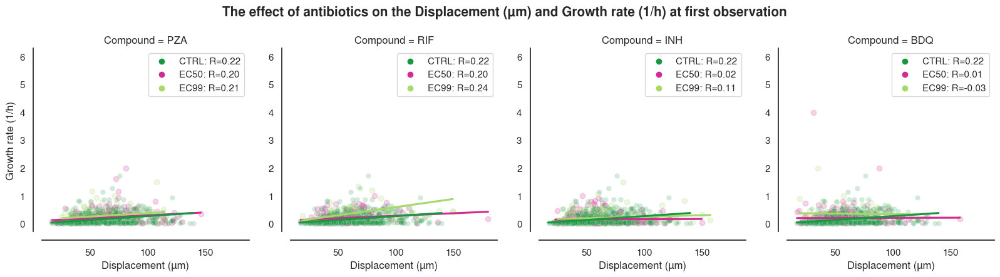

  0%|          | 0/7 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

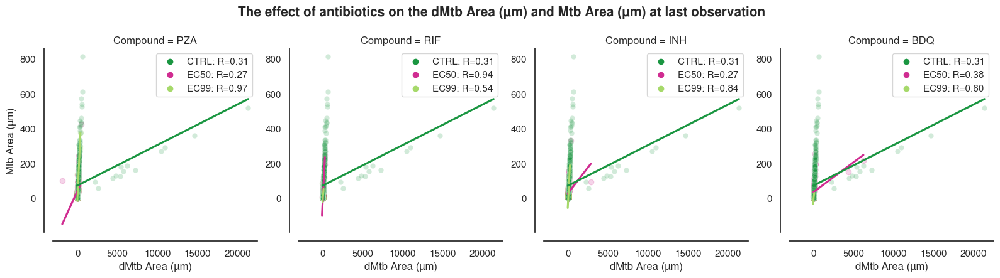

<Figure size 640x480 with 0 Axes>

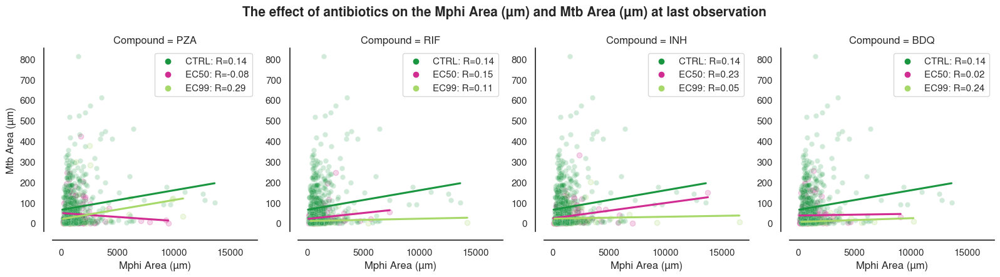

<Figure size 640x480 with 0 Axes>

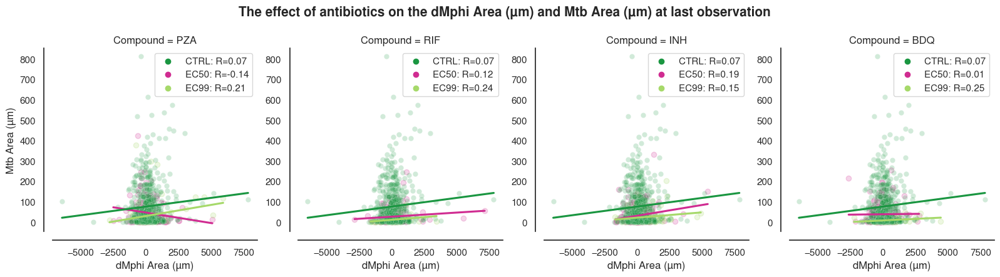

<Figure size 640x480 with 0 Axes>

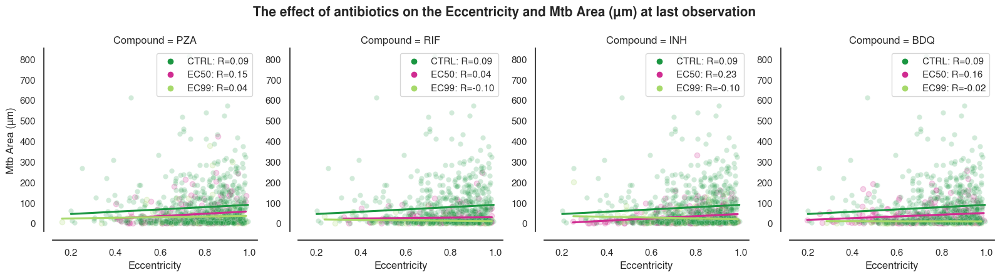

<Figure size 640x480 with 0 Axes>

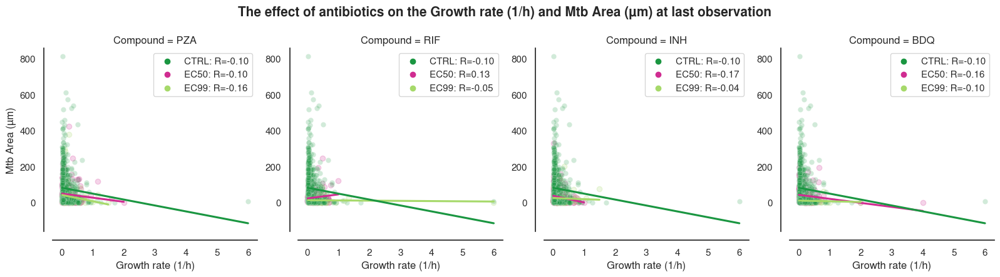

<Figure size 640x480 with 0 Axes>

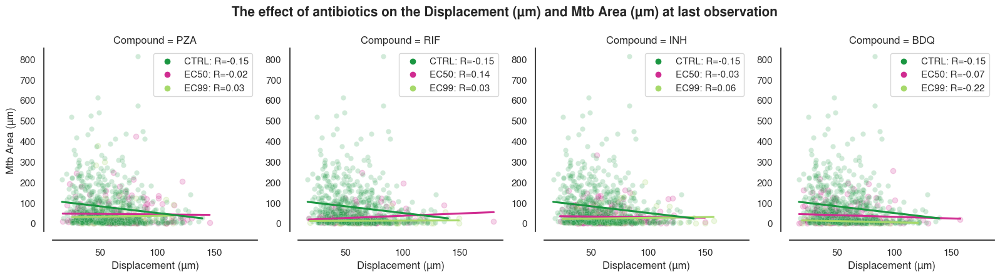

<Figure size 640x480 with 0 Axes>

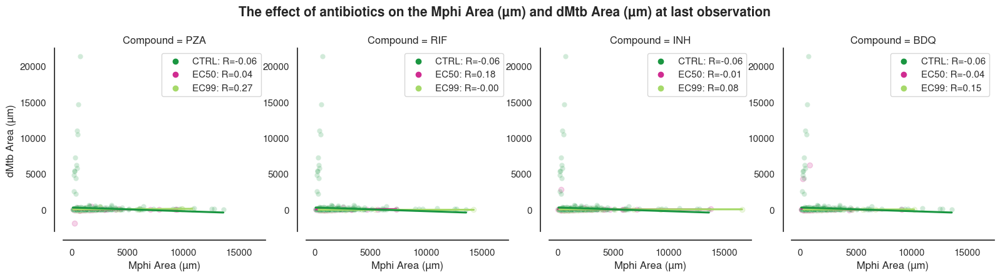

<Figure size 640x480 with 0 Axes>

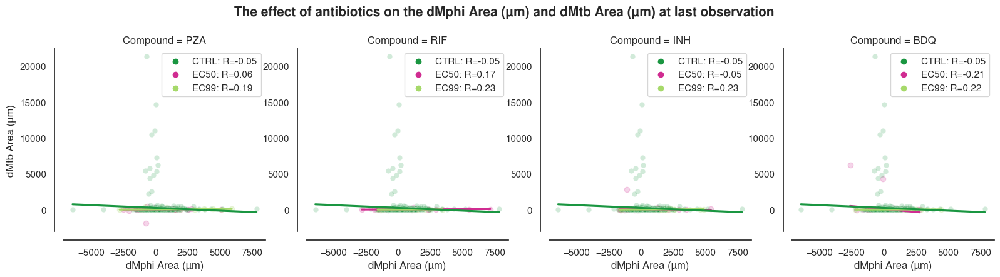

<Figure size 640x480 with 0 Axes>

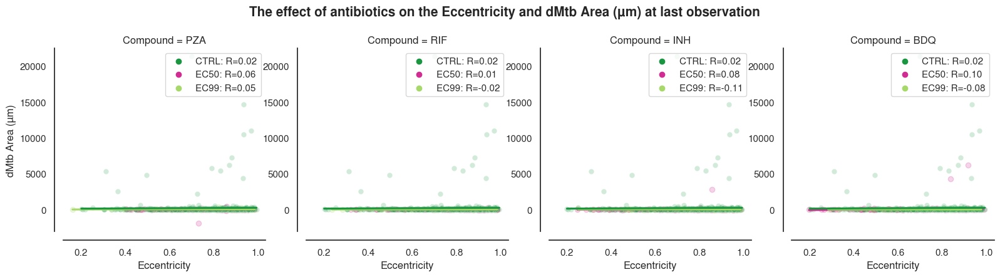

<Figure size 640x480 with 0 Axes>

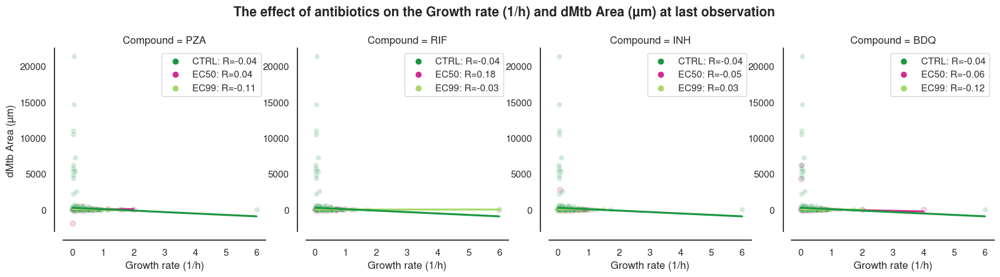

<Figure size 640x480 with 0 Axes>

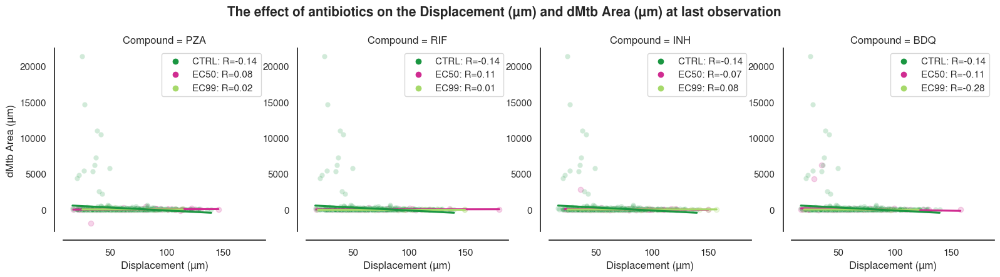

<Figure size 640x480 with 0 Axes>

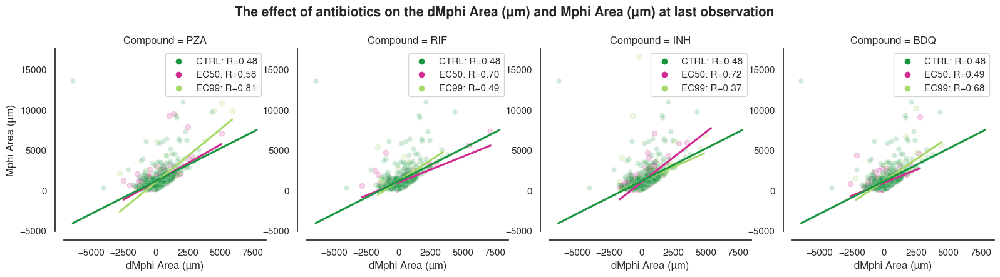

<Figure size 640x480 with 0 Axes>

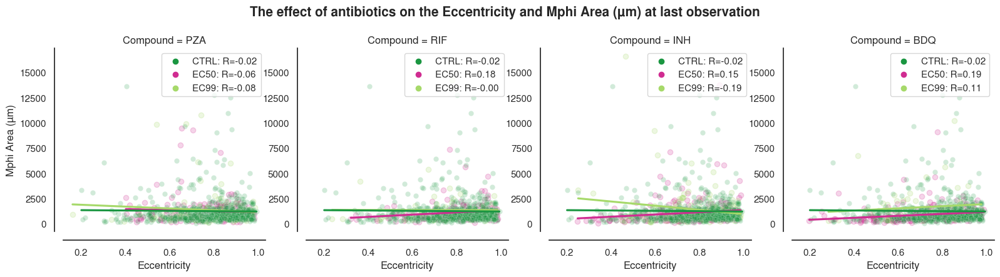

<Figure size 640x480 with 0 Axes>

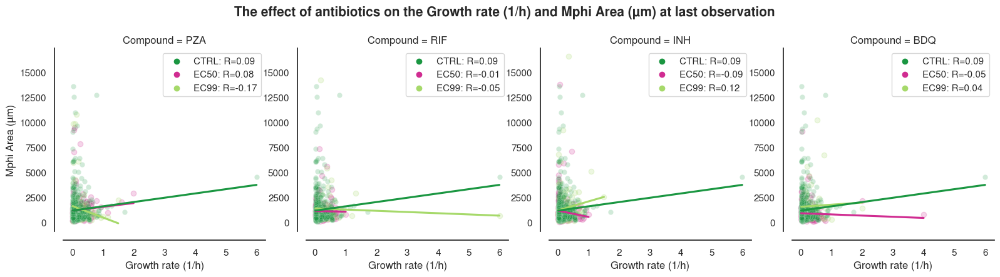

<Figure size 640x480 with 0 Axes>

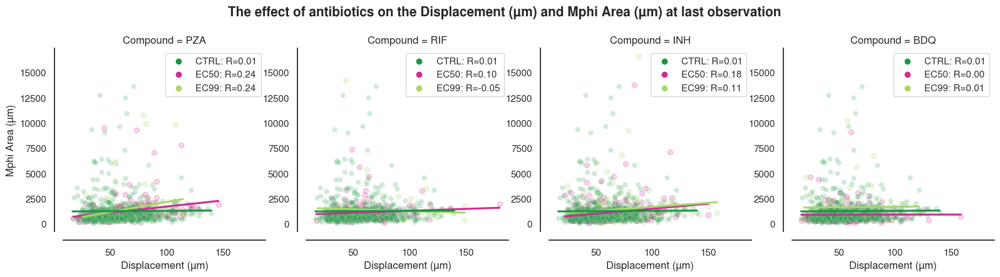

<Figure size 640x480 with 0 Axes>

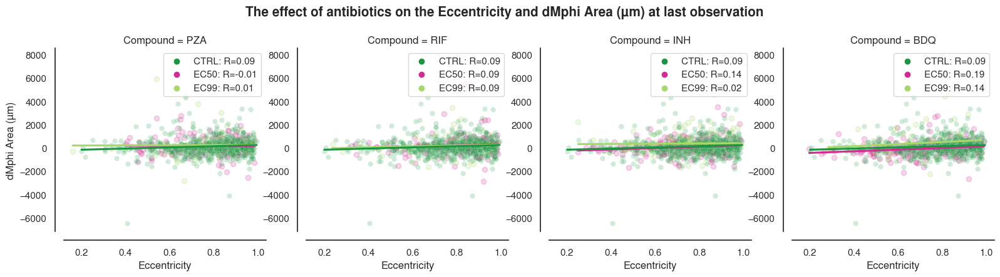

<Figure size 640x480 with 0 Axes>

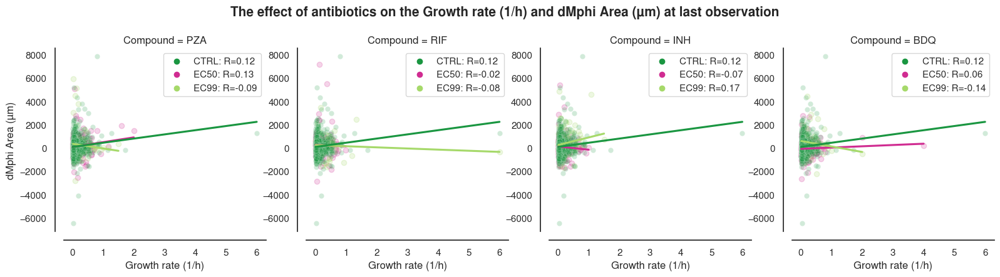

<Figure size 640x480 with 0 Axes>

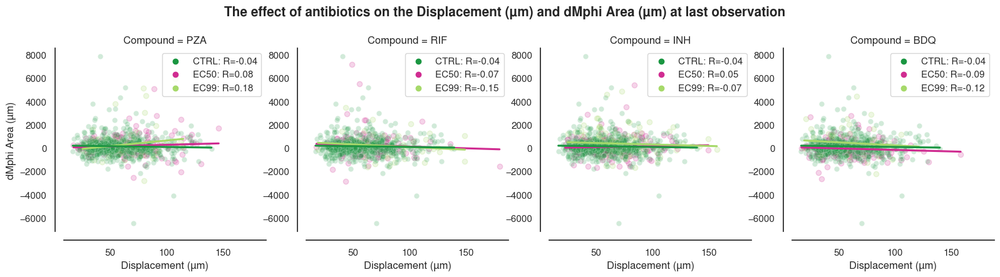

<Figure size 640x480 with 0 Axes>

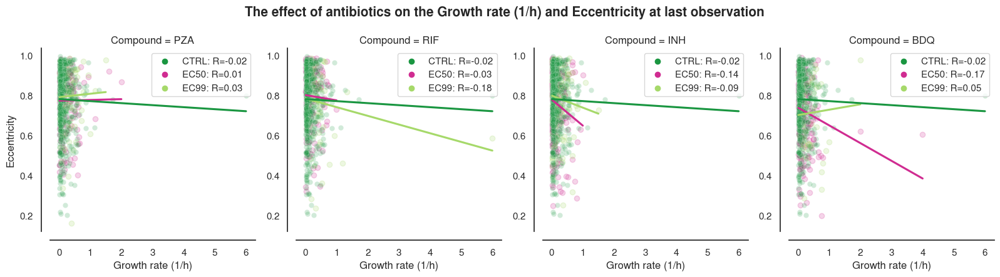

<Figure size 640x480 with 0 Axes>

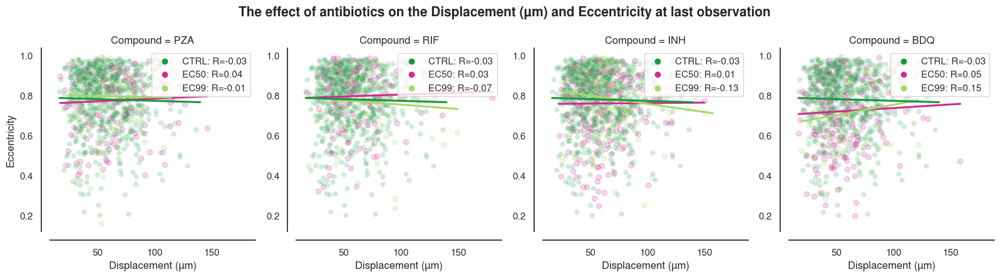

<Figure size 640x480 with 0 Axes>

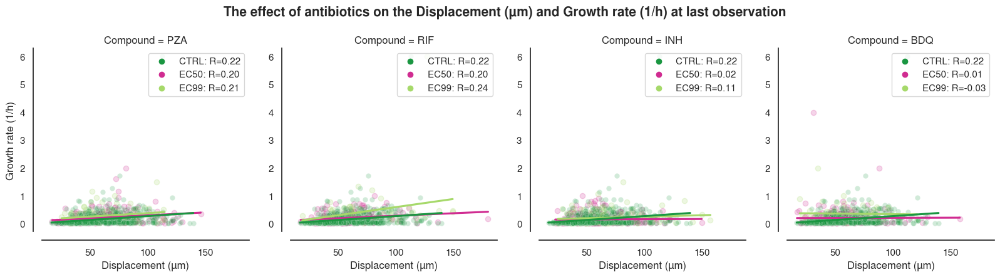

<Figure size 640x480 with 0 Axes>

In [520]:


# Define the list of variables
variables = ['Mtb Area (µm)', 'dMtb Area (µm)', 'Mphi Area (µm)', 'dMphi Area (µm)', 
             'Eccentricity', 'Growth rate (1/h)', 'Displacement (µm)']
whens = ['first', 'last']

for when in tqdm(whens):

    # Subset your data and remove duplicates based on Unique_ID
    subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep=when)
    
    # Convert all relevant columns to numeric, coercing errors to NaN and dropping them
    for col in variables:
        subset_df[col] = pd.to_numeric(subset_df[col], errors='coerce')
        
    # Drop rows with NaNs in the relevant columns
    subset_df = subset_df.dropna(subset=variables)

    #UNFILTERED 
    # Filter the data to include only the values within the IQR as there are one or two errant outliers
    iqr_filtered_df = subset_df #subset_df[(subset_df['reciprocal_dt'] >= Q1) & (subset_df['reciprocal_dt'] <= Q3)]
    
    # Separate control data
    control_data = iqr_filtered_df[iqr_filtered_df['Compound'] == 'CTRL']
    iqr_filtered_df = iqr_filtered_df[iqr_filtered_df['Compound'] != 'CTRL']  # Exclude control data from the main data
    
    # Loop through all combinations of y_var and x_var
    plotted_pairs = set()
    for y_var in tqdm(variables):
        for x_var in variables:
            if x_var != y_var and (y_var, x_var) not in plotted_pairs and (x_var, y_var) not in plotted_pairs:
                if 'Growth rate (1/h)' in [x_var, y_var]:
                    x_var, y_var = ('Growth rate (1/h)', y_var) if x_var == 'Growth rate (1/h)' else (x_var, 'Growth rate (1/h)')
                
                plotted_pairs.add((x_var, y_var))
                
                # Create the FacetGrid without the control data
                g = sns.FacetGrid(iqr_filtered_df, 
                                  col="Compound", 
                                  hue="Concentration", 
                                  palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], 
                                  hue_order=hue_order, 
                                  aspect=1, height=4, col_wrap=4)
    
                # Map the scatterplot for each compound with a line of best fit
                g.map_dataframe(sns.regplot, x=x_var, y=y_var, ci=None, scatter_kws={'alpha':0.2})
    
                # Add the control data to each subplot and include line of best fit and R score for control
                for ax in g.axes.flat:
                    sns.scatterplot(x=x_var, y=y_var, data=control_data, color=expanded_piyg[0], ax=ax, label='CTRL', alpha=0.2)
                    sns.regplot(x=x_var, y=y_var, data=control_data, ax=ax, scatter=False, color=expanded_piyg[0], ci=None)
    
                x_ctrl = control_data[x_var]
                y_ctrl = control_data[y_var]
                corr_ctrl, _ = pearsonr(x_ctrl, y_ctrl)
    
                # Calculate and annotate correlation coefficients on each subplot
                for ax in g.axes.flat:
                    compound = ax.get_title().replace('Compound = ', '')
                    annotations = []
                    handles, labels = [], []
                    # Add the handle and label for the control data first
                    handles.append(ax.scatter([], [], label='CTRL', color=expanded_piyg[0]))
                    labels.append(f'CTRL: R={corr_ctrl:.2f}')
                    for concentration in hue_order:
                        positions = iqr_filtered_df[(iqr_filtered_df['Compound'] == compound) & (iqr_filtered_df['Concentration'] == concentration)]
                        if not positions.empty:
                            x = positions[x_var]
                            y = positions[y_var]
                            corr, _ = pearsonr(x, y)
                            corr_text = f'{concentration}: R={corr:.2f}'
                            annotations.append(corr_text)
                            # Add the handle and label for the legend
                            color_index = hue_order.index(concentration)
                            handle = ax.scatter([], [], label=corr_text, color=[expanded_piyg[-1], expanded_piyg[2], expanded_piyg[1]][color_index])
                            handles.append(handle)
                            labels.append(corr_text)
    
                    # Create a custom legend for each subplot including the control
                    ax.legend(handles=handles, labels=labels, frameon=True, loc='upper right')
    
                # Add axis labels and title
                g.set_axis_labels(x_var, y_var)
                g.fig.subplots_adjust(top=0.9, wspace=0.2)  # Adjust wspace to add lateral padding
                
                for ax in g.axes.flat:
                    sns.despine(ax=ax, offset = 10)                
                
                g.fig.suptitle(f'The effect of antibiotics on the {x_var} and {y_var} at {when} observation', fontsize=15, fontweight='bold', y=1.07)
    
                # Format the filename to replace special characters
                x_var_filename = x_var.replace(' ', '_').replace('(', '').replace(')', '').replace('µ', 'u')
                y_var_filename = y_var.replace(' ', '_').replace('(', '').replace(')', '').replace('µ', 'u')
                if '1/h' in y_var_filename:
                    y_var_filename = y_var_filename.replace('1/h','1-h')
                if '1/h' in x_var_filename:
                    x_var_filename = x_var_filename.replace('1/h','1-h')
                    
                plt.savefig(os.path.join(output_dir, f'ATB_effect_{x_var_filename}_vs_{y_var_filename}_t{when}.png'), bbox_inches='tight', dpi=314)
                plt.show()
                plt.clf()


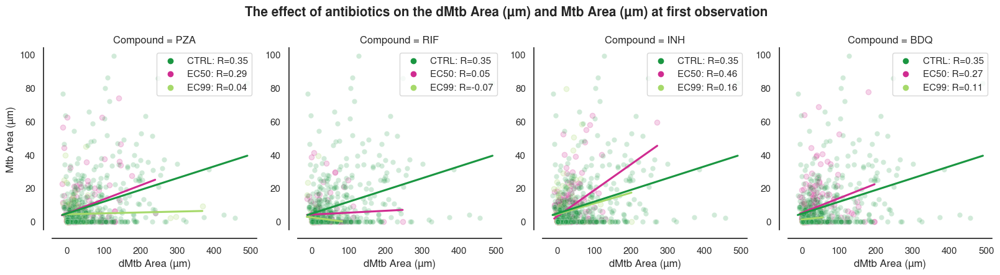

<Figure size 640x480 with 0 Axes>

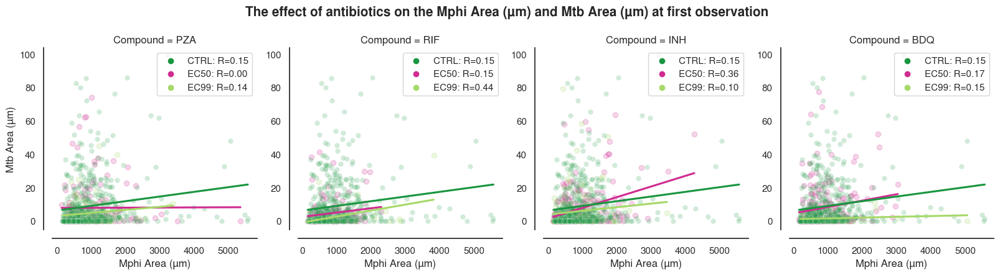

<Figure size 640x480 with 0 Axes>

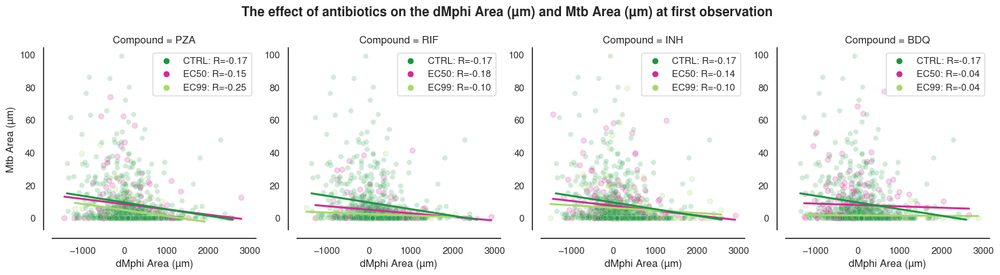

<Figure size 640x480 with 0 Axes>

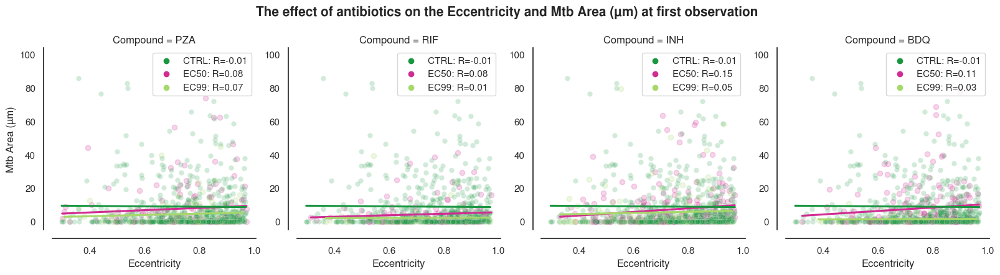

<Figure size 640x480 with 0 Axes>

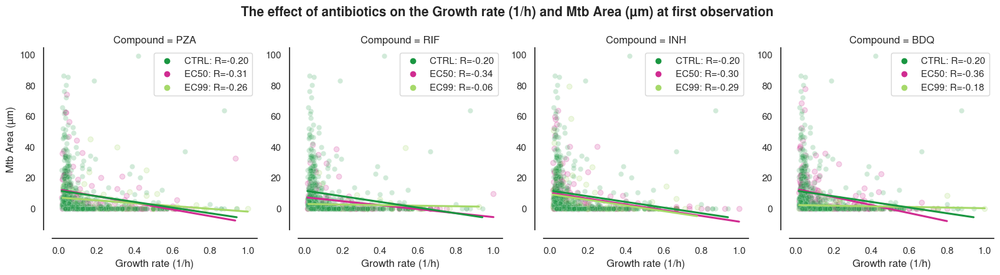

<Figure size 640x480 with 0 Axes>

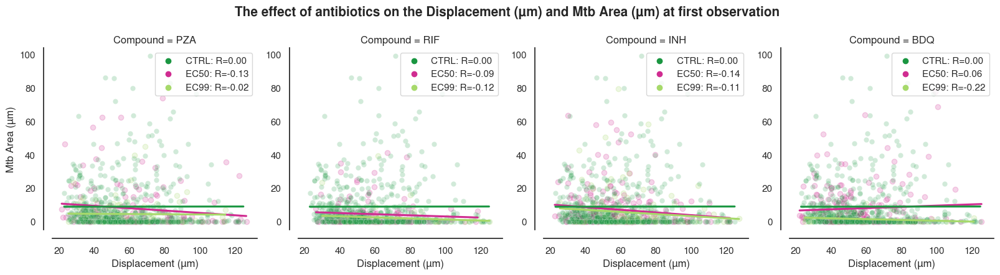

<Figure size 640x480 with 0 Axes>

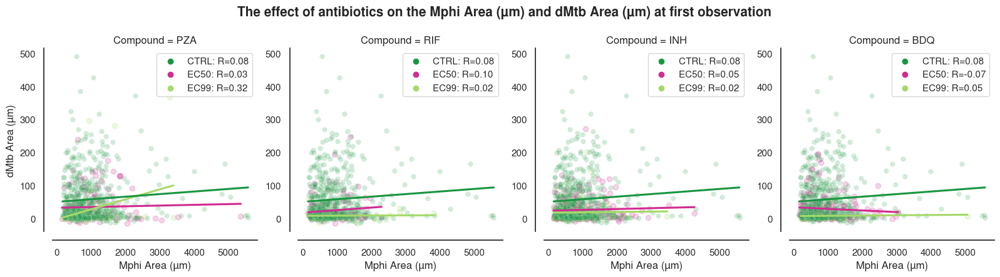

<Figure size 640x480 with 0 Axes>

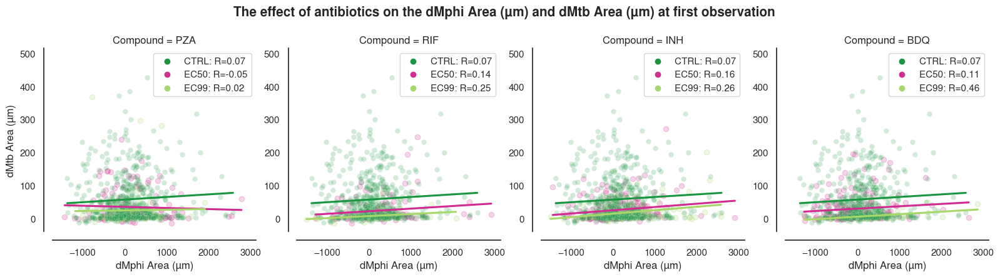

<Figure size 640x480 with 0 Axes>

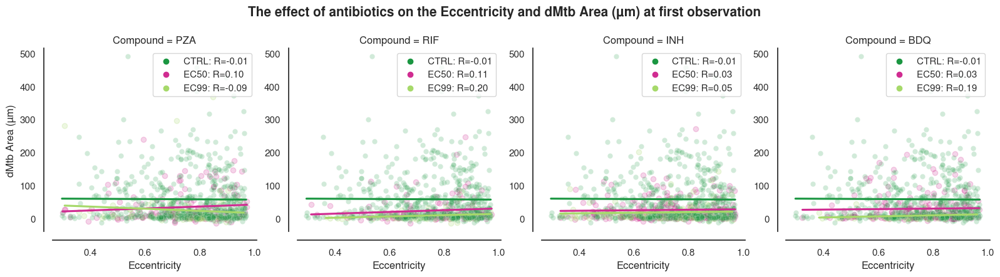

<Figure size 640x480 with 0 Axes>

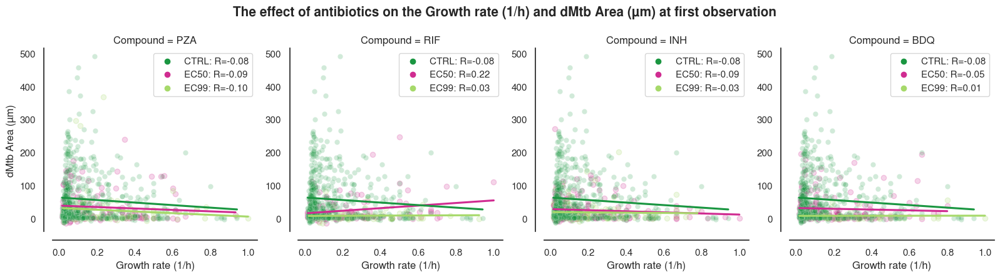

<Figure size 640x480 with 0 Axes>

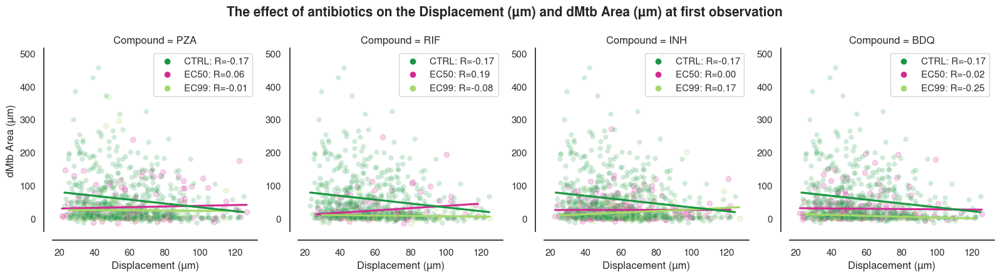

<Figure size 640x480 with 0 Axes>

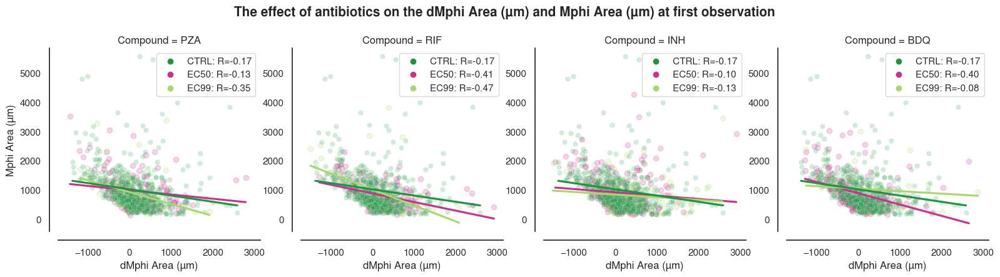

<Figure size 640x480 with 0 Axes>

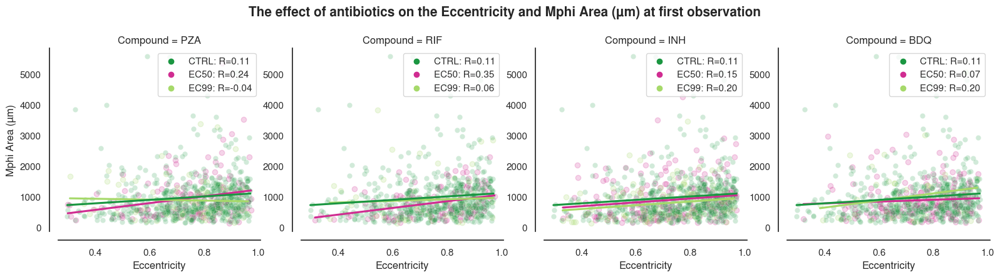

<Figure size 640x480 with 0 Axes>

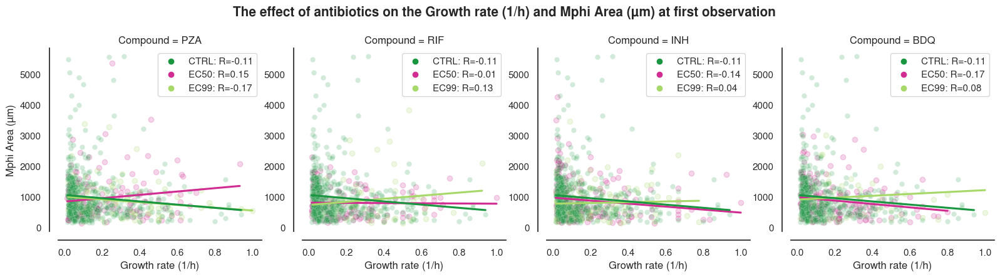

<Figure size 640x480 with 0 Axes>

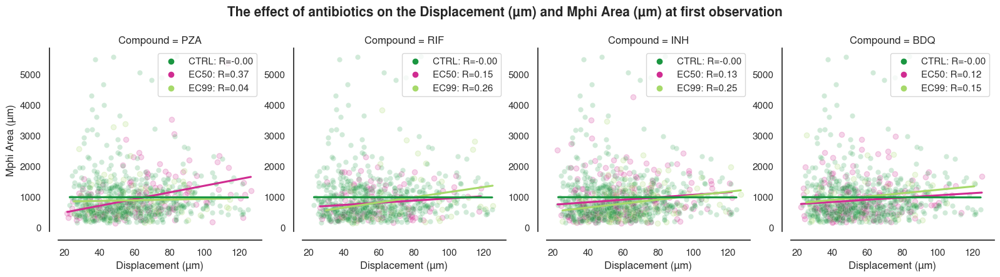

<Figure size 640x480 with 0 Axes>

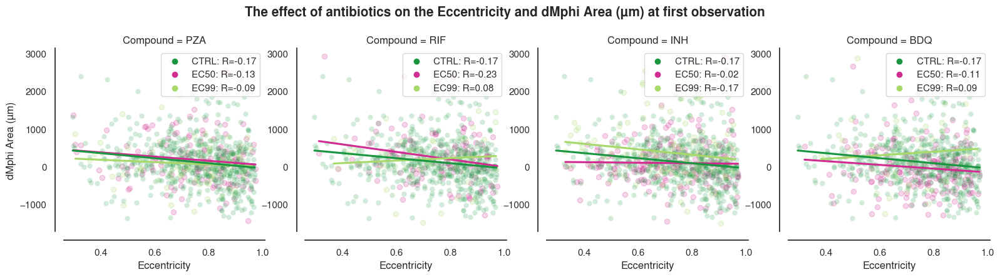

<Figure size 640x480 with 0 Axes>

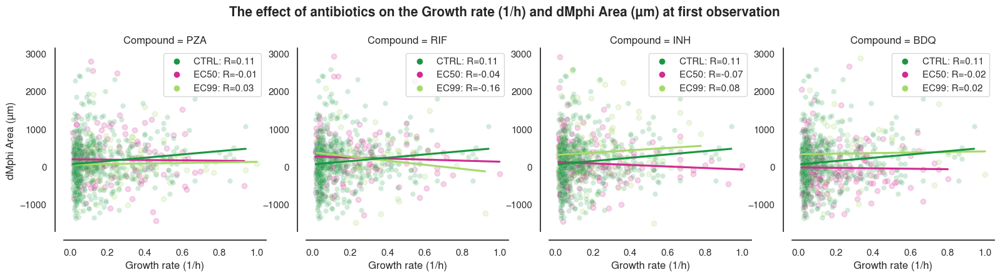

<Figure size 640x480 with 0 Axes>

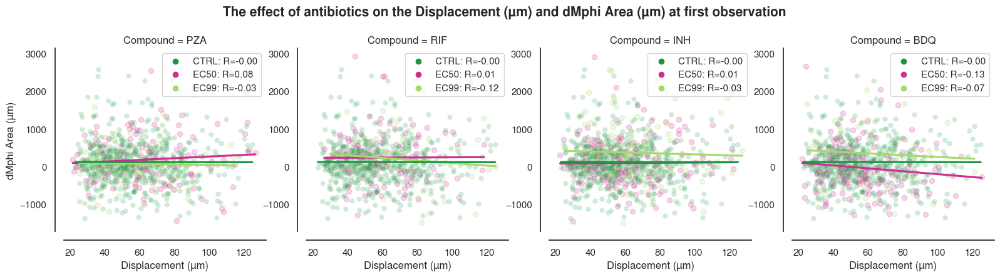

<Figure size 640x480 with 0 Axes>

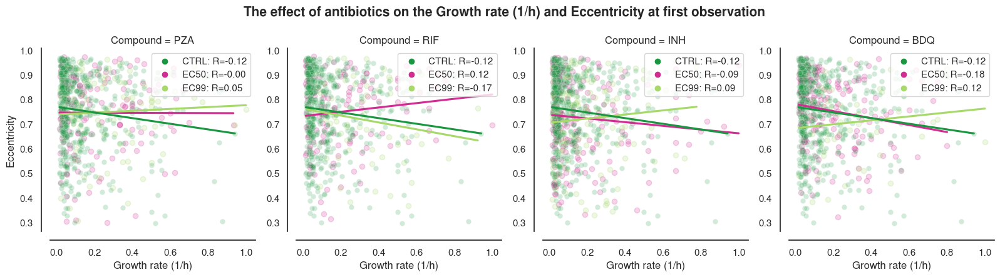

<Figure size 640x480 with 0 Axes>

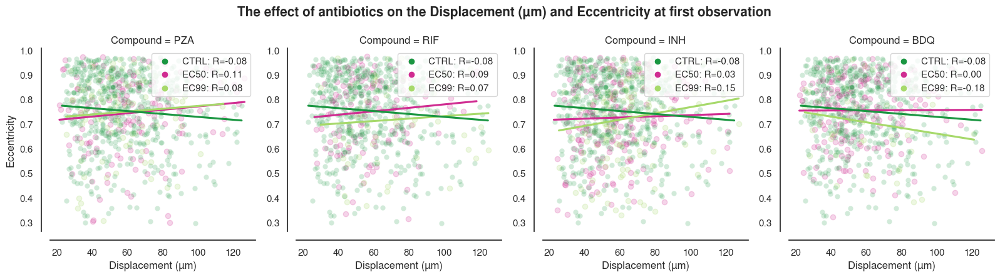

<Figure size 640x480 with 0 Axes>

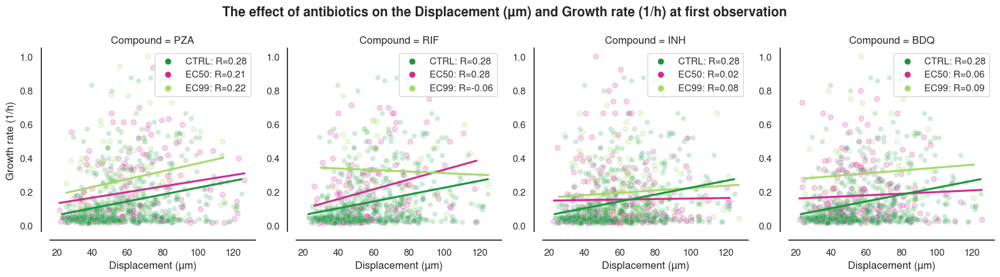

<Figure size 640x480 with 0 Axes>

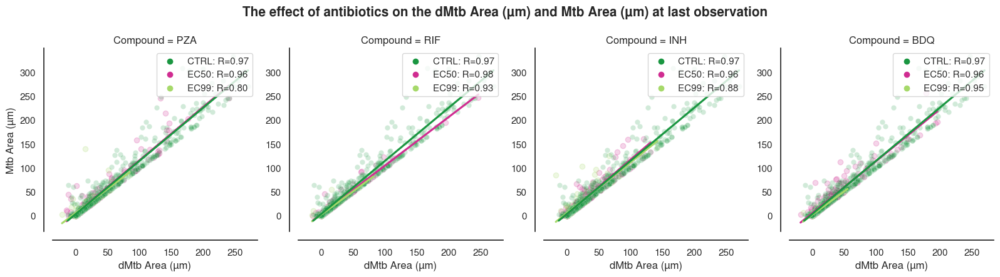

<Figure size 640x480 with 0 Axes>

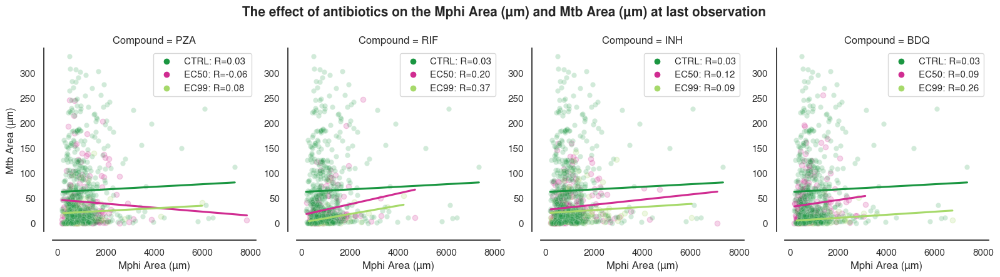

<Figure size 640x480 with 0 Axes>

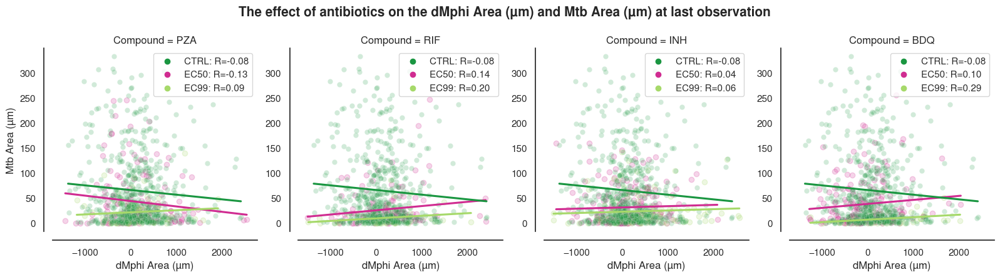

<Figure size 640x480 with 0 Axes>

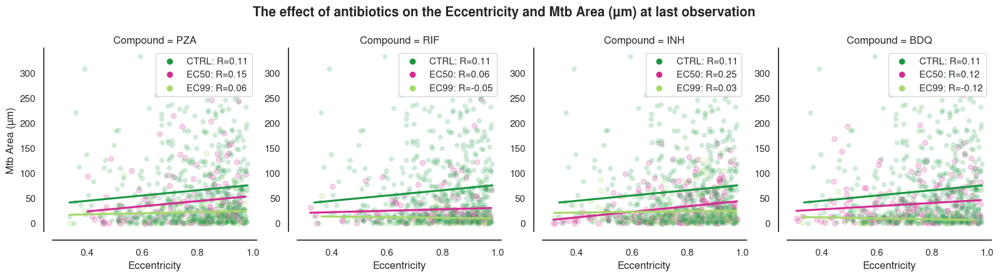

<Figure size 640x480 with 0 Axes>

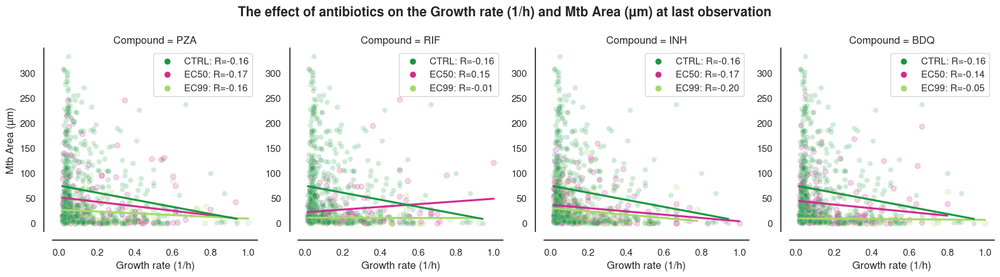

<Figure size 640x480 with 0 Axes>

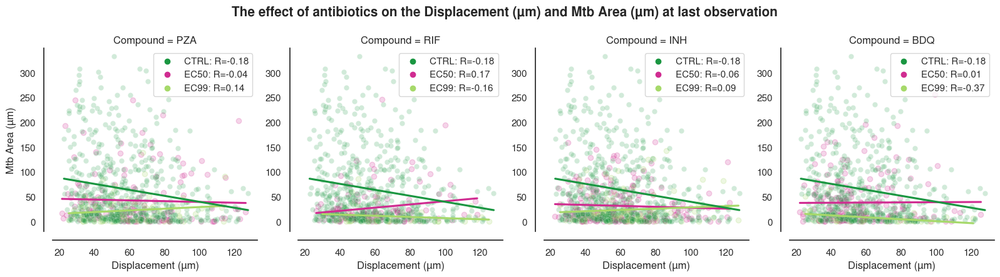

<Figure size 640x480 with 0 Axes>

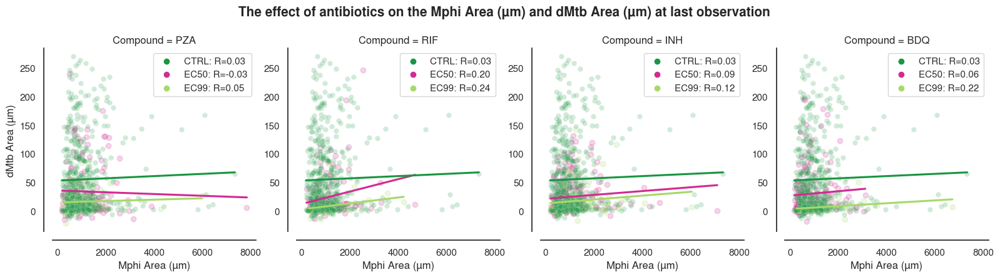

<Figure size 640x480 with 0 Axes>

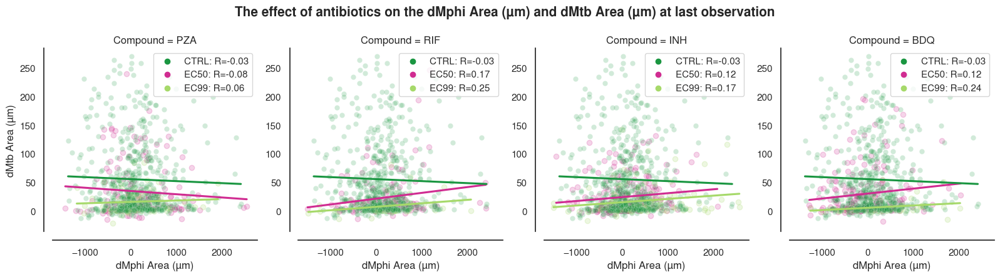

<Figure size 640x480 with 0 Axes>

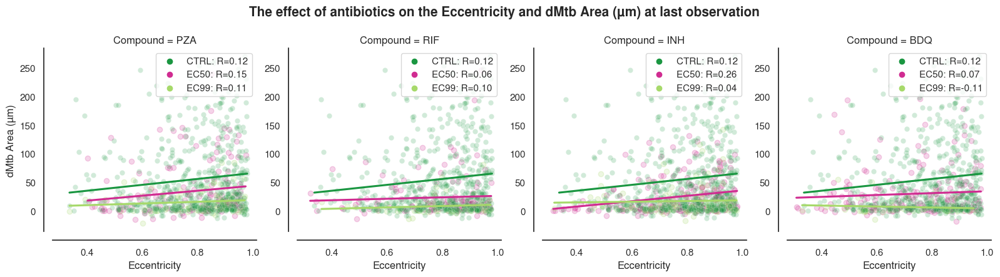

<Figure size 640x480 with 0 Axes>

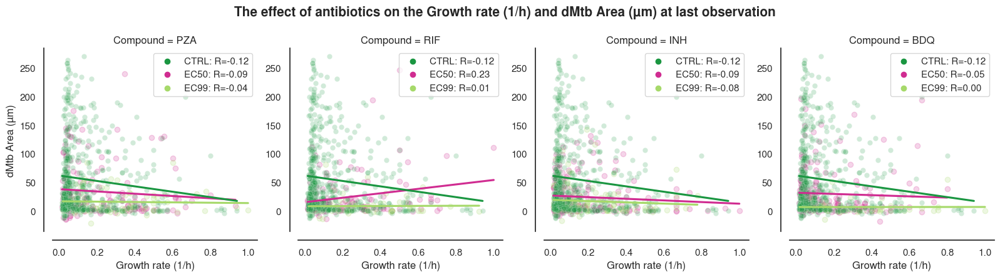

<Figure size 640x480 with 0 Axes>

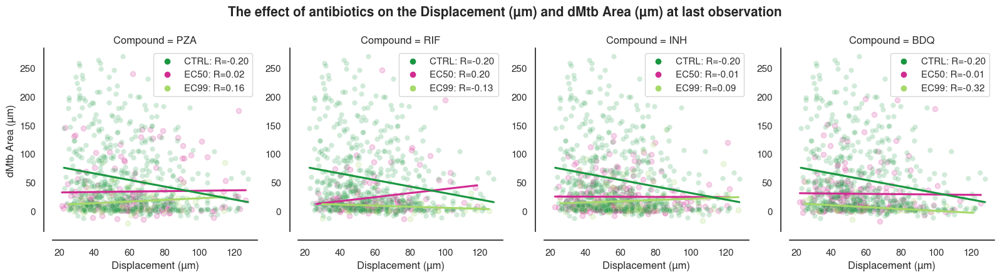

<Figure size 640x480 with 0 Axes>

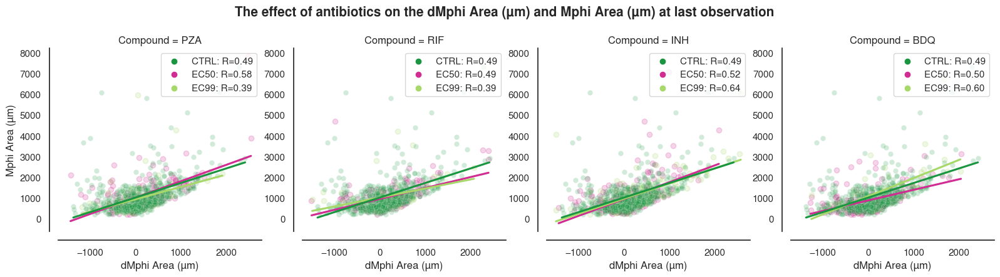

<Figure size 640x480 with 0 Axes>

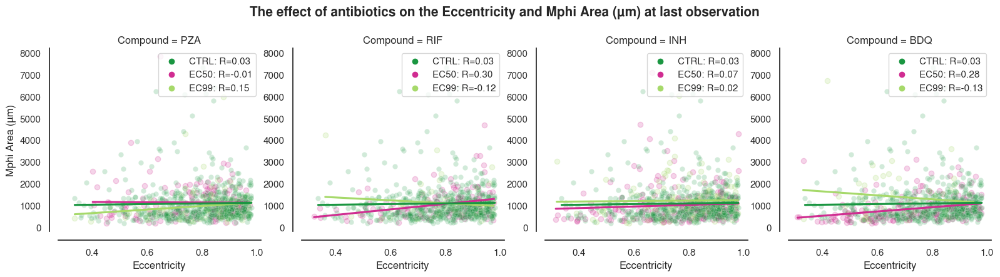

<Figure size 640x480 with 0 Axes>

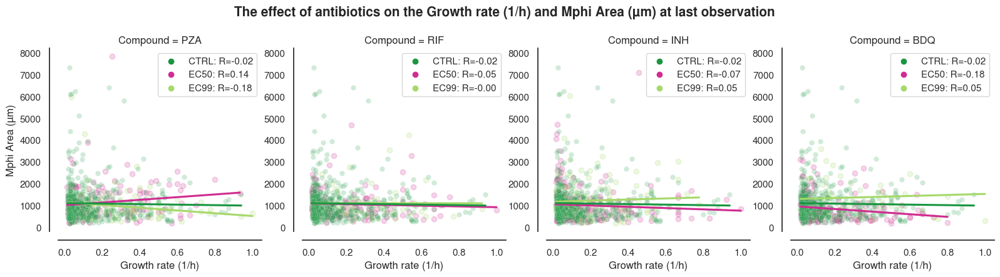

<Figure size 640x480 with 0 Axes>

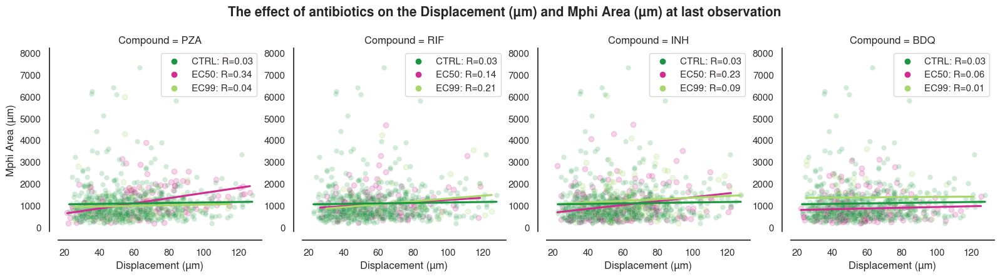

<Figure size 640x480 with 0 Axes>

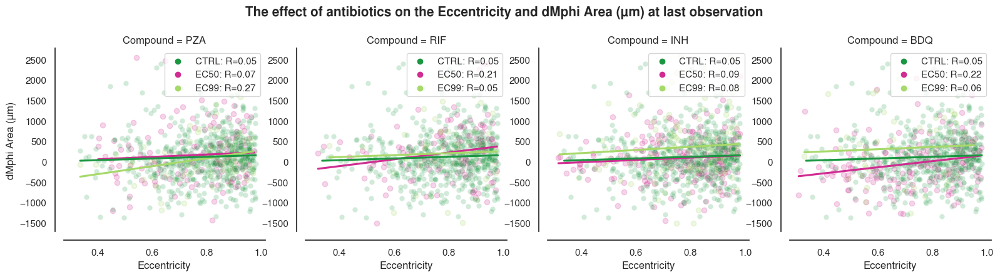

<Figure size 640x480 with 0 Axes>

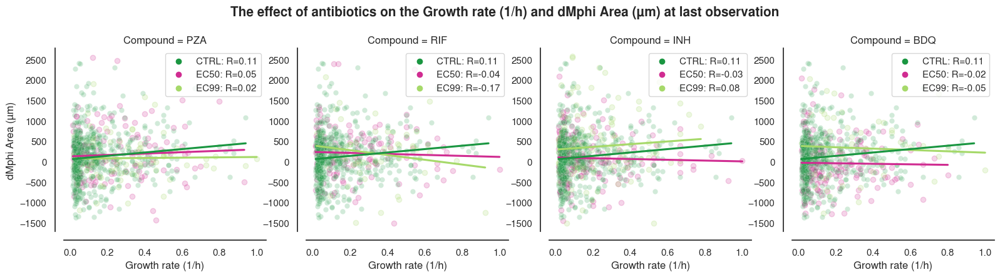

<Figure size 640x480 with 0 Axes>

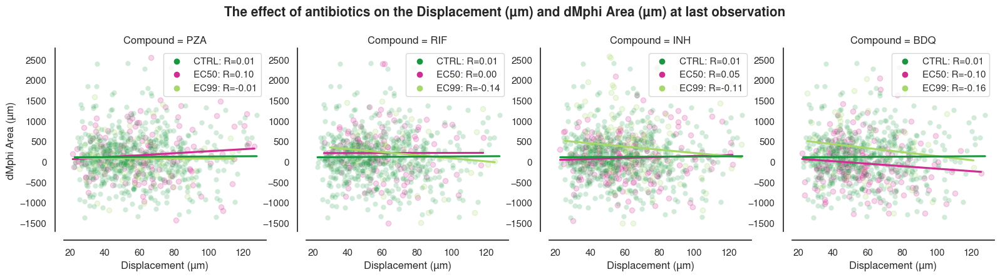

<Figure size 640x480 with 0 Axes>

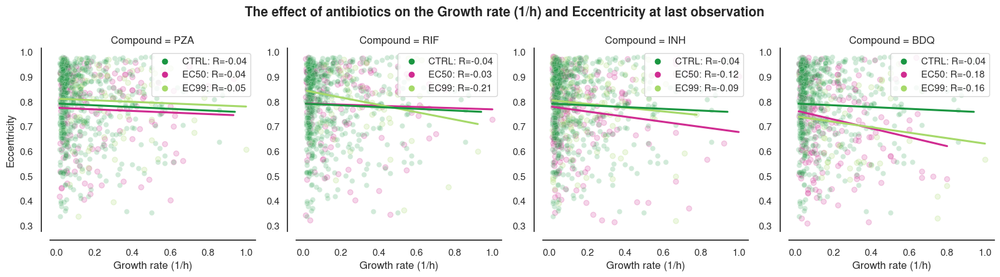

<Figure size 640x480 with 0 Axes>

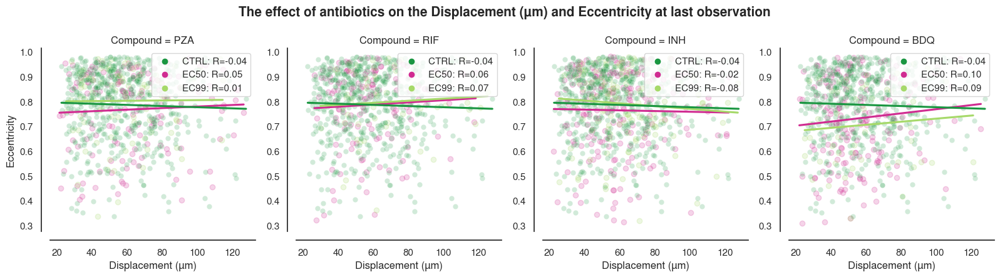

<Figure size 640x480 with 0 Axes>

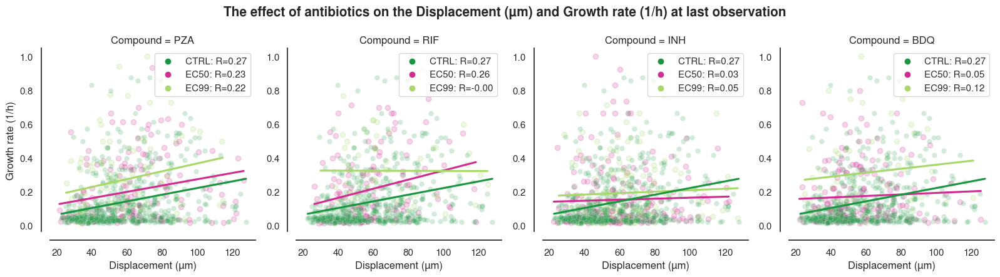

<Figure size 640x480 with 0 Axes>

In [612]:
for when in whens:

    # Subset your data and remove duplicates based on Unique_ID
    subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep=when)
    
    # Convert all relevant columns to numeric, coercing errors to NaN
    for col in variables:
        subset_df[col] = pd.to_numeric(subset_df[col], errors='coerce')
    
    # Drop rows with NaNs in the relevant columns
    subset_df = subset_df.dropna(subset=variables)
    
    # Calculate the IQR for each variable and filter the data
    for col in variables:
        Q1 = subset_df[col].quantile(0.01)
        Q3 = subset_df[col].quantile(0.99)
        IQR = Q3 - Q1
        subset_df = subset_df[(subset_df[col] >= Q1) & (subset_df[col] <= Q3)]
    
    iqr_filtered_df = subset_df

    # Separate control data
    control_data = iqr_filtered_df[iqr_filtered_df['Compound'] == 'CTRL']
    iqr_filtered_df = iqr_filtered_df[iqr_filtered_df['Compound'] != 'CTRL']  # Exclude control data from the main data
    
    # Loop through all combinations of y_var and x_var
    plotted_pairs = set()
    for y_var in variables:
        for x_var in variables:
            if x_var != y_var and (y_var, x_var) not in plotted_pairs and (x_var, y_var) not in plotted_pairs:
                if 'Growth rate (1/h)' in [x_var, y_var]:
                    x_var, y_var = ('Growth rate (1/h)', y_var) if x_var == 'Growth rate (1/h)' else (x_var, 'Growth rate (1/h)')
                
                plotted_pairs.add((x_var, y_var))
                
                # Create the FacetGrid without the control data
                g = sns.FacetGrid(iqr_filtered_df, 
                                  col="Compound", 
                                  hue="Concentration", 
                                  palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], 
                                  hue_order=hue_order, 
                                  aspect=1, height=4, col_wrap=4)
    
                # Map the scatterplot for each compound with a line of best fit
                g.map_dataframe(sns.regplot, x=x_var, y=y_var, ci=None, scatter_kws={'alpha':0.2})
    
                # Add the control data to each subplot and include line of best fit and R score for control
                for ax in g.axes.flat:
                    sns.scatterplot(x=x_var, y=y_var, data=control_data, color=expanded_piyg[0], ax=ax, label='CTRL', alpha=0.2)
                    sns.regplot(x=x_var, y=y_var, data=control_data, ax=ax, scatter=False, color=expanded_piyg[0], ci=None)
    
                x_ctrl = control_data[x_var]
                y_ctrl = control_data[y_var]
                corr_ctrl, _ = pearsonr(x_ctrl, y_ctrl)
    
                # Calculate and annotate correlation coefficients on each subplot
                for ax in g.axes.flat:
                    compound = ax.get_title().replace('Compound = ', '')
                    annotations = []
                    handles, labels = [], []
                    # Add the handle and label for the control data first
                    handles.append(ax.scatter([], [], label='CTRL', color=expanded_piyg[0]))
                    labels.append(f'CTRL: R={corr_ctrl:.2f}')
                    for concentration in hue_order:
                        positions = iqr_filtered_df[(iqr_filtered_df['Compound'] == compound) & (iqr_filtered_df['Concentration'] == concentration)]
                        if not positions.empty:
                            x = positions[x_var]
                            y = positions[y_var]
                            corr, _ = pearsonr(x, y)
                            corr_text = f'{concentration}: R={corr:.2f}'
                            annotations.append(corr_text)
                            # Add the handle and label for the legend
                            color_index = hue_order.index(concentration)
                            handle = ax.scatter([], [], label=corr_text, color=[expanded_piyg[-1], expanded_piyg[2], expanded_piyg[1]][color_index])
                            handles.append(handle)
                            labels.append(corr_text)
    
                    # Create a custom legend for each subplot including the control
                    ax.legend(handles=handles, labels=labels, frameon=True, loc='upper right')
    
                # Add axis labels and title
                g.set_axis_labels(x_var, y_var)
                g.fig.subplots_adjust(top=0.9, wspace=0.2)  # Adjust wspace to add lateral padding
                
                for ax in g.axes.flat:
                    sns.despine(ax=ax, offset = 10)                
                
                g.fig.suptitle(f'The effect of antibiotics on the {x_var} and {y_var} at {when} observation', fontsize=15, fontweight='bold', y=1.07)
    
                # Format the filename to replace special characters
                x_var_filename = x_var.replace(' ', '_').replace('(', '').replace(')', '').replace('µ', 'u')
                y_var_filename = y_var.replace(' ', '_').replace('(', '').replace(')', '').replace('µ', 'u')
                if '1/h' in y_var_filename:
                    y_var_filename = y_var_filename.replace('1/h','1-h')
                if '1/h' in x_var_filename:
                    x_var_filename = x_var_filename.replace('1/h','1-h')
                    
                plt.savefig(os.path.join(output_dir, f'ATB_effect_IQR_{x_var_filename}_vs_{y_var_filename}_t{when}.png'), bbox_inches='tight', dpi=314)
                plt.show()
                plt.clf()

## histograms

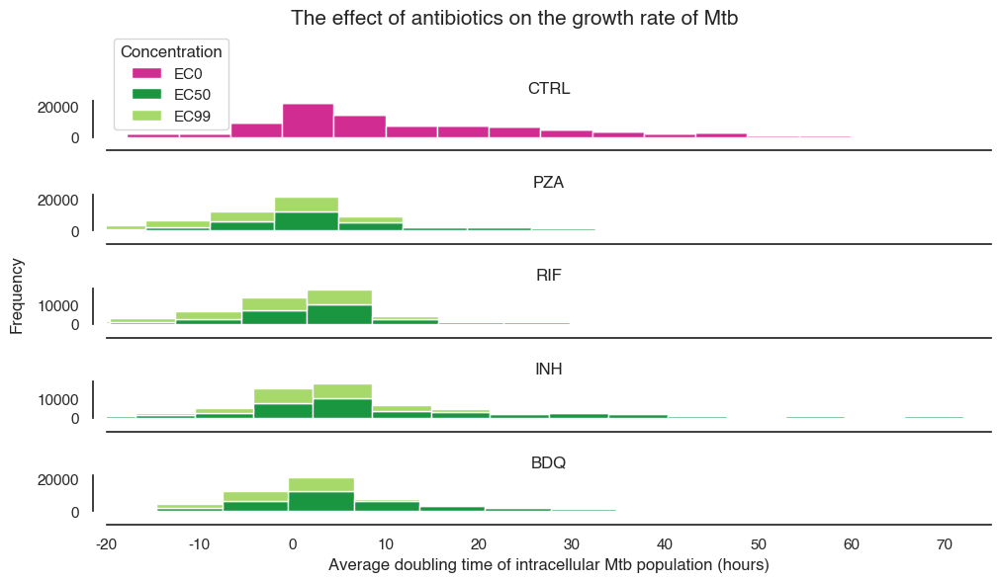

In [82]:
# Your existing DataFrame after filtering
subset_df = df[(df['r2'] > 0.5) & (df['Strain/Compound'] != 'RD1')]

# Define the palette
palette = [expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]]  # Make sure these colors are defined

# Unique compounds and concentrations
compounds = subset_df['Compound'].unique()
concentrations = subset_df['Concentration'].unique()

# Set up the plot
fig, axes = plt.subplots(len(compounds), 1, figsize=(10, 6), sharex=True)  # Use fig, axes for subplot management
if len(compounds) == 1:  # Handle case where there's only one compound
    axes = [axes]

for i, (ax, compound) in enumerate(zip(axes, compounds)):
    data = [subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == conc)]['dt'].dropna() for conc in concentrations]
    ax.hist(data, bins=20, stacked=True, label=concentrations, color=palette)
    ax.set_title(compound)
    if i == 0:
        ax.legend(title='Concentration')
    if i < len(compounds) - 1:
        ax.set_xticklabels([])  # Hide x ticks for all but the last subplot
    else:
        ax.set_xticks(np.arange(-20, 80, 10))  # Set specific x-ticks for the last plot if necessary
        ax.set_xticklabels(np.arange(-20, 80, 10))  # Ensure labels are visible

fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical', fontsize=12)  # Add a common y-axis label
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.suptitle('The effect of antibiotics on the growth rate of Mtb', fontsize=15, fontweight='bold')
sns.despine(offset=10)
fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for suptitle
# Set the limits for the x-axis if necessary  # Adjust layout to make room for suptitle
plt.xlim(-20, 75)
plt.savefig(os.path.join(output_dir, 'ATB_effect_hist_dt.png'), bbox_inches = 'tight', dpi = 314)
plt.show()

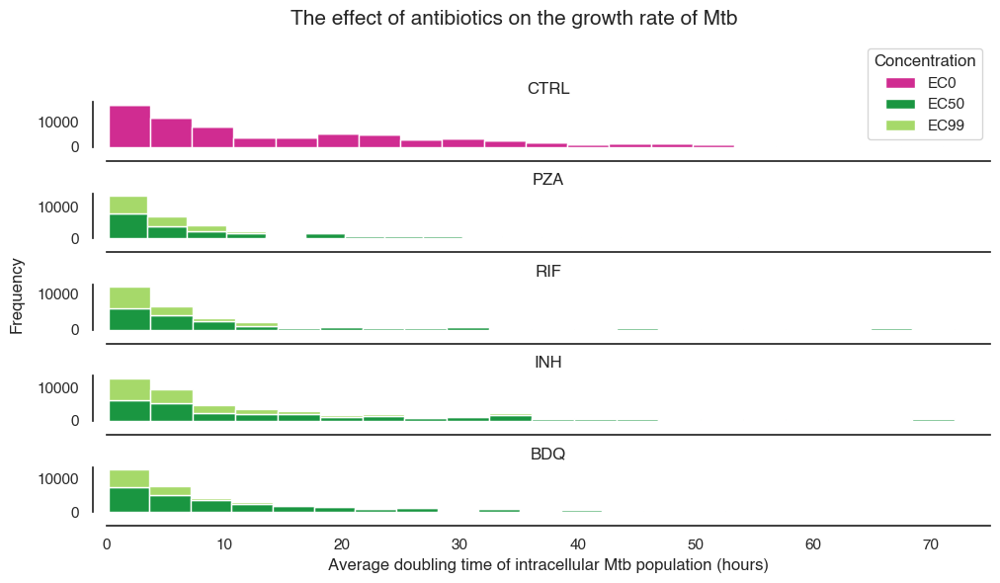

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Your existing DataFrame after filtering
subset_df = df[(df['r2'] > 0.5) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')]

# Define the palette
palette = [expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]]  # Make sure these colors are defined

# Unique compounds and concentrations
compounds = subset_df['Compound'].unique()
concentrations = subset_df['Concentration'].unique()

# Set up the plot
fig, axes = plt.subplots(len(compounds), 1, figsize=(10, 6), sharex=True)  # Use fig, axes for subplot management
if len(compounds) == 1:  # Handle case where there's only one compound
    axes = [axes]

for i, (ax, compound) in enumerate(zip(axes, compounds)):
    data = [subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == conc)]['dt'].dropna() for conc in concentrations]
    ax.hist(data, bins=20, stacked=True, label=concentrations, color=palette)
    ax.set_title(compound)
    if i == 0:
        ax.legend(title='Concentration')
    if i < len(compounds) - 1:
        ax.set_xticklabels([])  # Hide x ticks for all but the last subplot
    else:
        ax.set_xticks(np.arange(0, 80, 10))  # Set specific x-ticks for the last plot if necessary
        ax.set_xticklabels(np.arange(0, 80, 10))  # Ensure labels are visible

fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical', fontsize=12)  # Add a common y-axis label
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.suptitle('The effect of antibiotics on the growth rate of Mtb', fontsize=15, fontweight='bold')
sns.despine(offset=10)
fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for suptitle
plt.xlim(0, 75)  # Set the limits for the x-axis if necessary
plt.savefig(os.path.join(output_dir, 'ATB_effect_hist_dt_gt0.png'), bbox_inches='tight', dpi=314)
plt.show()

# ARX

In [8]:
# df['dMtb'] = df['delta Mtb max fold-change normalised max area']
df['Mtb'] = df['Mtb Area'] #df['Intracellular thresholded Mtb content smooth']

In [23]:
unique_ID = '85.4.5'
sc_df = df.loc[unique_ID]
sc_df

,Time (hours),Mtb Area,dMtb,Strain,Compound,Concentration,Unique ID,Acquisition ID,Cell ID,Mphi Area,...,Strain/Compound,dMtb/dt,%dMtb/dt,%dMtb,Mean Mtb Intensity,Thresholded Mean Mtb Intensity,Infection Status,Initial Infection Status,Final Infection Status,Rolling Avg dMtb/dt
281595,0,2675.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,46764.0,...,CTRL,0.0,0.000000,201.271028,443.901398,127.701759,True,True,True,0.104293
281596,1,2376.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,62884.0,...,CTRL,-299.0,-11.177570,201.271028,402.362885,75.280693,True,True,True,-20.000379
281597,2,2276.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,67435.0,...,CTRL,-100.0,-4.208754,201.271028,390.603058,62.043819,True,True,True,-26.695353
281598,3,2608.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,48134.0,...,CTRL,332.0,14.586995,201.271028,428.111389,112.511589,True,True,True,-4.615656
281599,4,2398.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,60039.0,...,CTRL,-210.0,-8.052147,201.271028,403.103180,79.544876,True,True,True,-18.585858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281665,70,9059.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,14227.0,...,CTRL,155.0,1.740791,201.271028,2083.896240,1993.407959,True,True,True,68.266667
281666,71,8928.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,13664.0,...,CTRL,-131.0,-1.446076,201.271028,2144.229248,2056.757812,True,True,True,49.000000
281667,72,8303.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,12339.0,...,CTRL,-625.0,-7.000448,201.271028,2249.445312,2164.719971,True,True,True,4.333333
281668,73,6219.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,9494.0,...,CTRL,-2084.0,-25.099362,201.271028,2205.718750,2113.622314,True,True,True,-149.933333


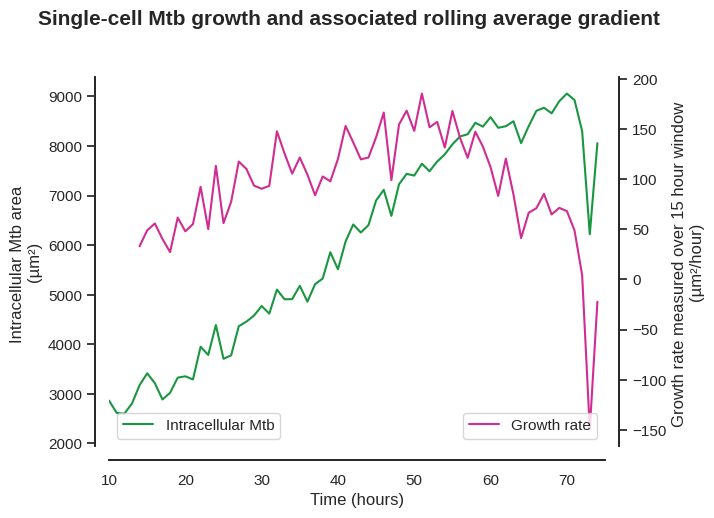

In [27]:

# Calculate the rolling average of 'dMtb/dt' over a specified window (e.g., 15)
window_size = 15
sc_df['Rolling Avg dMtb/dt'] = sc_df['dMtb/dt'].rolling(window=window_size).mean()

# Create the first plot
ax1 = sns.lineplot(x='Time (hours)', y='Mtb Area', data=sc_df, color=expanded_piyg[0], label='Intracellular Mtb')
plt.legend(loc='lower left')
ax1.set_ylabel('Intracellular Mtb area \n(µm\u00b2)')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot the rolling average on the second y-axis
sns.lineplot(x='Time (hours)', y='Rolling Avg dMtb/dt', data=sc_df, ax=ax2, color=expanded_piyg[-1], label='Growth rate')  # Adjust color as needed

# Set the y-axis label for the second y-axis
ax2.set_ylabel(f'Growth rate measured over {window_size} hour window \n(µm\u00b2/hour)')
plt.legend(loc='lower right')

# Adjust plot appearance
sns.despine(offset=10, top=True, right=False)
plt.xlim(10, 75)  # Adjust as per your data

# Set the x-axis label and title for the plot
ax1.set_xlabel('Time (hours)')
plt.gcf().suptitle('Single-cell Mtb growth and associated rolling average gradient', 
                   fontsize=15, fontweight='bold', y=1.02)

plt.show()

### Is this max gradient correlated to antibiotic condition?

In [67]:
unique_ids = df['Unique ID'].unique()
len(unique_ids)

3988

In [73]:
unique_ids = df['Unique ID'].unique()
rolling_means = pd.Series(index=df.index)  # Initialize a Series to store the rolling means
max_rolling_means = {}
window_size = 15  # Define your window size

for cell_id in tqdm(unique_ids, total = len(unique_ids)):
    # Filter the DataFrame for the current cell ID
    cell_data = df[df['Unique ID'] == cell_id]

    # Calculate the rolling mean for this cell
    rolling_mean = cell_data['dMtb/dt'].rolling(window=window_size).mean()

    # Store the results in the rolling_means Series
    rolling_means[cell_data.index] = rolling_mean

    # Store the maximum rolling mean for this cell ID
    max_rolling_means[cell_id] = rolling_mean.max()

# Assign the rolling means back to the DataFrame
df[f'dMtb/dt,T={window_size}'] = rolling_means

# Create a new column for the maximum rolling mean per unique ID
df['Max Rolling Mean'] = df['Unique ID'].map(max_rolling_means)

  0%|          | 0/3988 [00:00<?, ?it/s]

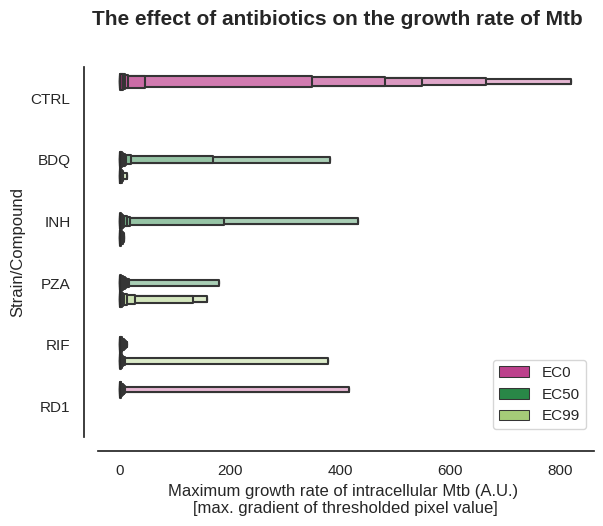

In [79]:
df
g = sns.boxenplot(x="Max. dMtb/dt", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Maximum growth rate of intracellular Mtb (A.U.) \n[max. gradient of thresholded pixel value]")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
# plt.savefig(os.path.join(output_dir, 'ATB_effect_max_growth_rate.png'), bbox_inches = 'tight', dpi = 314)

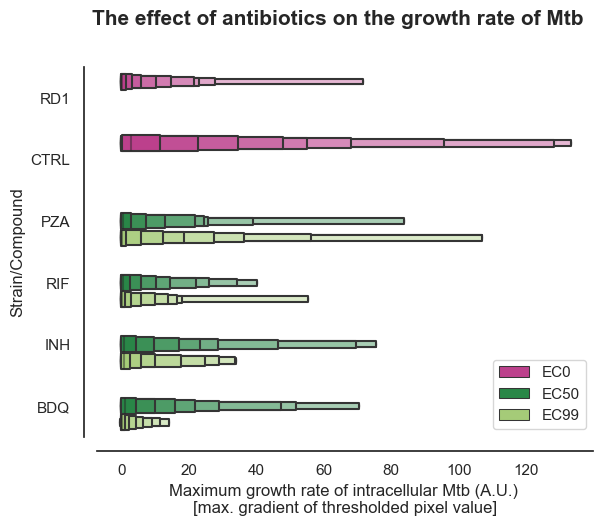

In [163]:
g = sns.boxenplot(x="Max. dMtb gradient", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Maximum growth rate of intracellular Mtb (A.U.) \n[max. gradient of thresholded pixel value]")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
plt.savefig(os.path.join(output_dir, 'ATB_effect_max_growth_rate.png'), bbox_inches = 'tight', dpi = 314)

In [92]:
help(sns.boxenplot)

Help on function boxenplot in module seaborn.categorical:

boxenplot(data=None, *, x=None, y=None, hue=None, order=None, hue_order=None, orient=None, color=None, palette=None, saturation=0.75, width=0.8, dodge=True, k_depth='tukey', linewidth=None, scale='exponential', outlier_prop=0.007, trust_alpha=0.05, showfliers=True, ax=None, box_kws=None, flier_kws=None, line_kws=None)
    Draw an enhanced box plot for larger datasets.
    
    This style of plot was originally named a "letter value" plot because it
    shows a large number of quantiles that are defined as "letter values".  It
    is similar to a box plot in plotting a nonparametric representation of a
    distribution in which all features correspond to actual observations. By
    plotting more quantiles, it provides more information about the shape of
    the distribution, particularly in the tails. For a more extensive
    explanation, you can read the paper that introduced the plot:
    https://vita.had.co.nz/papers/letter-v

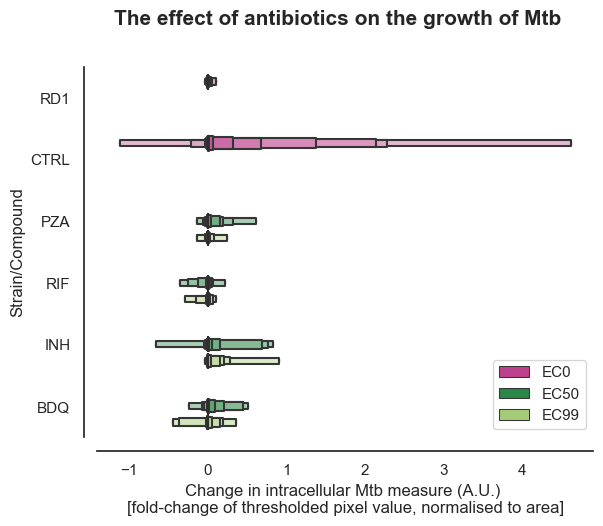

In [164]:
sns.boxenplot(x="dMtb", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale='linear'
              )  
sns.despine(offset = 10)
# plt.xlim(0,5)
plt.xlabel("Change in intracellular Mtb measure (A.U.) \n[fold-change of thresholded pixel value, normalised to area]")
plt.gcf().suptitle('The effect of antibiotics on the growth of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
plt.savefig(os.path.join(output_dir, 'dMtb_boxenplot.png'), bbox_inches = 'tight', dpi = 314)

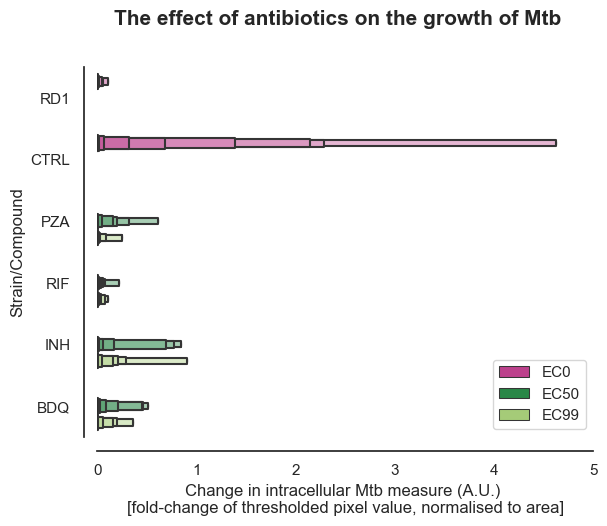

In [165]:
sns.boxenplot(x="dMtb", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale='linear'
              )  
sns.despine(offset = 10)
plt.xlim(0,5)
plt.xlabel("Change in intracellular Mtb measure (A.U.) \n[fold-change of thresholded pixel value, normalised to area]")
plt.gcf().suptitle('The effect of antibiotics on the growth of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
plt.savefig(os.path.join(output_dir, '+dMtb_boxenplot.png'), bbox_inches = 'tight', dpi = 314)

In [ ]:
for acq_ID in df['Acquisition ID'].unique():
    subset_df = [df['Acquisition ID'] == acq_ID]
    mean_max_dMtb_gradient = np.mean 